In [4]:
import praw
import csv

# Initialize Reddit API
reddit = praw.Reddit(client_id='RY69_rOBWktf9hZtTvGBGw',
                     client_secret='YP8oyGvYI-Rk9lw2H1_cA8-BBImimw',
                     user_agent='script:PoliticsNetworkAnalyzer:v1.0 (by u/NastieBi)')

queries = [
    "politics", "anarchism", "communism", "antifa", "government", "election", "democracy", 
    "conservative", "liberal", "progressive", "left", "right", "socialism", "capitalism", 
    "alt-right", "libertarian", "patriot", "nationalism", "political","policy", "diplomacy", "justice", 
    "progressivism", "liberalism", "conservatism", "libertarianism", "authoritarian", 
    "fascism", "social democracy", "anarchy", "feminism", "environmentalism", "activism", "far-left", "far-right", "neo-nazi", "extremism",
    "populism", "isolationism", 
    "geopolitics",
    "political economy",
]




In [5]:
# LOAD the already saved subreddits

import csv

# Path to the saved CSV file
csv_file_path = 'subreddit_with_query_types.csv'

# Load the CSV file into a dictionary
subreddits = {}
with open(csv_file_path, mode='r', encoding='utf-8') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Reconstruct the subreddit dictionary
        subreddits[row['name']] = {
            'id': row['id'],
            'name': row['name'],
            'subscribers': int(row['subscribers']) if row['subscribers'].isdigit() else 0,
            'public_description': row['public_description'],
            'description': row['description'],
            'created_utc': float(row['created_utc']) if row['created_utc'] else 0.0,
            'over18': row['over18'].lower() == 'true' if row['over18'] else False,
            'lang': row['lang'],
            'primary_color': row['primary_color'],
            'key_color': row['key_color'],
            'restrict_commenting': row['restrict_commenting'].lower() == 'true' if row['restrict_commenting'] else False,
            'restrict_posting': row['restrict_posting'].lower() == 'true' if row['restrict_posting'] else False,
            'allow_videos': row['allow_videos'].lower() == 'true' if row['allow_videos'] else False,
            'allow_images': row['allow_images'].lower() == 'true' if row['allow_images'] else False,
            'all_original_content': row['all_original_content'].lower() == 'true' if row['all_original_content'] else False,
            'spoilers_enabled': row['spoilers_enabled'].lower() == 'true' if row['spoilers_enabled'] else False,
            'show_media': row['show_media'].lower() == 'true' if row['show_media'] else False,
            'submission_type': row['submission_type'],
            'query_type': row['query_type'].split(', ') if row['query_type'] else []  # Convert back to a list
        }

# Verify the reconstructed dictionary
print(f"Total subreddits loaded: {len(subreddits)}")
print(list(subreddits.keys()))  # Print all subreddit names

Total subreddits loaded: 4469
['politics', 'NeutralPolitics', 'CanadaPolitics', 'ShitPoliticsSays', 'ukpolitics', 'Ask_Politics', 'AustralianPolitics', 'conspiracy', 'Conservative', 'California_Politics', 'AmericanPolitics', 'PoliticalCompassMemes', 'Wild_Politics', 'PoliticsPeopleTwitter', 'Gamingcirclejerk', 'Libertarian', 'CivPolitics', 'Law_and_Politics', 'guns', 'PoliticalDiscussion', 'NewsAndPolitics', 'World_Politics', 'WayOfTheBern', 'stupidpol', 'TexasPolitics', 'UK_Politics', 'PoliticalHumor', 'unitedkingdom', 'SpainPolitics', 'Askpolitics', 'neoliberal', 'moderatepolitics', 'ClassPoliticsTwitter', 'worldnews', 'AskReddit', 'mexico_politics', 'PikabuPolitics', 'SandersForPresident', 'Destiny', 'irishpolitics', 'VirginiaPolitics', 'australia', 'india', 'uspolitics', 'CanadianPolitics', 'canada', 'undelete', 'BritishPolitics', 'MalaysiaPolitics', 'Enough_Sanders_Spam', 'LabourUK', 'ColoradoPolitics', 'gunpolitics', 'unpopularopinion', 'memes', 'MissouriPolitics', 'teenagers', '

In [6]:
import json

# Path to the saved JSON file
json_file_path = "shared_users.json"

# Load the JSON file into a dictionary
with open(json_file_path, "r", encoding="utf-8") as json_file:
    shared_users_map = json.load(json_file)

# Convert keys and values to match the type as saved
shared_users_map = {key: int(value) for key, value in shared_users_map.items()}

# Verify the data
print(f"Type of shared_users_map: {type(shared_users_map)}")  # Should be <class 'dict'>
print(f"Number of subreddit pairs: {len(shared_users_map)}")  # Number of pairs loaded
print(f"Sample data: {list(shared_users_map.items())[:5]}")  # Display the first 5 pairs

Type of shared_users_map: <class 'dict'>
Number of subreddit pairs: 8247891
Sample data: [('politics-NeutralPolitics', 1), ('politics-CanadaPolitics', 3), ('politics-ShitPoliticsSays', 1), ('politics-ukpolitics', 6), ('politics-Ask_Politics', 3)]


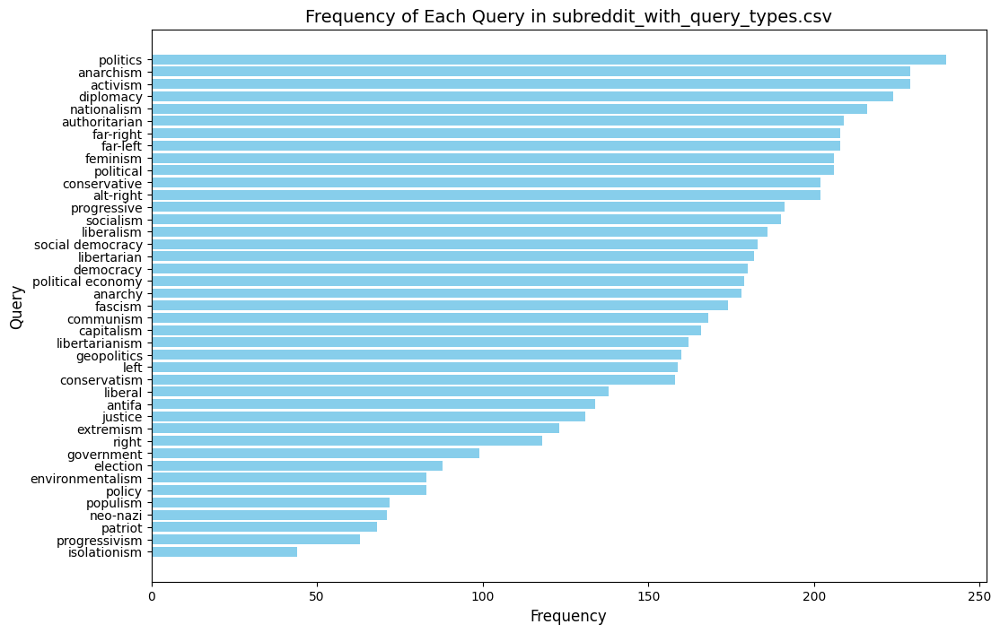

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Carica il dataset
file_path = 'subreddit_with_query_types.csv'
df = pd.read_csv(file_path)

# Conta il numero di volte che ogni keyword appare nella lista 'query_type'
query_counts = {}
for query_list in df['query_type']:
    if isinstance(query_list, str):  # Verifica che non ci siano valori NaN
        keywords = query_list.split(', ')
        for keyword in keywords:
            if keyword in query_counts:
                query_counts[keyword] += 1
            else:
                query_counts[keyword] = 1

# Converti il dizionario in un DataFrame per una migliore visualizzazione
query_df = pd.DataFrame(list(query_counts.items()), columns=['Query', 'Count']).sort_values(by='Count', ascending=False)

# Visualizza il risultato come grafico a barre
plt.figure(figsize=(12, 8))
plt.barh(query_df['Query'], query_df['Count'], color='skyblue')
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Query', fontsize=12)
plt.title('Frequency of Each Query in subreddit_with_query_types.csv', fontsize=14)
plt.gca().invert_yaxis()  # Inverti l'asse y per mostrare i più frequenti in alto
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import json
import csv

# Costruzione del grafo
def build_network_filtered(shared_users_map, subreddit_details, threshold=2):
    G = nx.Graph()
    
    # Aggiunta dei nodi con filtro per lang = 'en' e aggiunta degli attributi
    for subreddit in subreddit_details:
        lang = subreddit['lang']
        if lang == 'en':  # Filtra solo subreddit con lingua inglese
            G.add_node(
                subreddit['name'], 
                id=subreddit['id'],
                subscribers=subreddit['subscribers'],
                public_description=subreddit['public_description'],
                description=subreddit['description'],
                created_utc=subreddit['created_utc'],
                over18=subreddit['over18'],
                primary_color=subreddit['primary_color'],
                key_color=subreddit['key_color'],
                restrict_commenting=subreddit['restrict_commenting'],
                restrict_posting=subreddit['restrict_posting'],
                allow_videos=subreddit['allow_videos'],
                allow_images=subreddit['allow_images'],
                all_original_content=subreddit['all_original_content'],
                spoilers_enabled=subreddit['spoilers_enabled'],
                show_media=subreddit['show_media'],
                submission_type=subreddit['submission_type'],
                query_type=subreddit['query_type']
            )
    
    # Aggiunta degli archi basati sugli utenti condivisi
    for sub_pair, shared_users in shared_users_map.items():
        sub1, sub2 = sub_pair.split('-')
        if sub1 in G.nodes and sub2 in G.nodes and shared_users >= threshold:
            G.add_edge(sub1, sub2, weight=shared_users)
    
    # Rimuovi nodi isolati
    isolated_nodes = list(nx.isolates(G))
    G.remove_nodes_from(isolated_nodes)
    
    # Mantieni solo la giant component
    if len(G) > 0:  # Controlla che il grafo non sia vuoto
        largest_component = max(nx.connected_components(G), key=len)
        G = G.subgraph(largest_component).copy()
    
    return G

# Visualizzazione del grafo con nodi colorati in base a 'subscribers'
def visualize_network_by_subscribers(G, figsize=(15, 15)):
    # Generazione del layout
    pos = nx.spring_layout(G, seed=42)
    
    # Colori basati su subscribers
    subscribers = nx.get_node_attributes(G, 'subscribers')
    node_colors = [subscribers[node] for node in G.nodes]

    # Disegna i nodi
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, pos, node_size=30, node_color=node_colors, cmap=plt.cm.viridis, alpha=0.7)
    
    # Disegna gli archi
    weights = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edges(G, pos, width=[0.1 + 0.05 * weights[edge] for edge in G.edges], alpha=0.7)

    # Legenda per i colori dei nodi
    plt.title("Subreddit Network Colored by Subscribers", fontsize=12)
    plt.axis("off")
    plt.show()

# Carica i dati dal JSON e CSV
with open("shared_users.json", "r", encoding="utf-8") as json_file:
    shared_users_map = json.load(json_file)

subreddit_details = []
with open("subreddit_with_query_types.csv", "r", encoding="utf-8") as csv_file:
    reader = csv.DictReader(csv_file)
    for row in reader:
        row['subscribers'] = int(row['subscribers']) if row['subscribers'].isdigit() else 0  # Converti subscribers in int o assegna 0
        row['created_utc'] = float(row['created_utc']) if row['created_utc'] else 0.0  # Converti created_utc in float o assegna 0.0
        row['over18'] = row['over18'].lower() == 'true' if row['over18'] else False  # Converti over18 in boolean
        row['restrict_commenting'] = row['restrict_commenting'].lower() == 'true' if row['restrict_commenting'] else False
        row['restrict_posting'] = row['restrict_posting'].lower() == 'true' if row['restrict_posting'] else False
        row['allow_videos'] = row['allow_videos'].lower() == 'true' if row['allow_videos'] else False
        row['allow_images'] = row['allow_images'].lower() == 'true' if row['allow_images'] else False
        row['all_original_content'] = row['all_original_content'].lower() == 'true' if row['all_original_content'] else False
        row['spoilers_enabled'] = row['spoilers_enabled'].lower() == 'true' if row['spoilers_enabled'] else False
        row['show_media'] = row['show_media'].lower() == 'true' if row['show_media'] else False
        row['query_type'] = row['query_type'].split(', ') if row['query_type'] else []  # Converti query_type in lista
        subreddit_details.append(row)

# Costruzione del grafo filtrato
threshold = 10  # Soglia per utenti condivisi
G_filtered = build_network_filtered(shared_users_map, subreddit_details, threshold=threshold)

# Salva i dettagli dei nodi nella giant component
giant_component_nodes = set(G_filtered.nodes)
filtered_subreddits = [sub for sub in subreddit_details if sub['name'] in giant_component_nodes]

with open("filtered_subreddits.csv", "w", encoding="utf-8", newline="") as csv_file:
    writer = csv.DictWriter(csv_file, fieldnames=reader.fieldnames)
    writer.writeheader()
    writer.writerows(filtered_subreddits)

print("Dettagli dei subreddit nella giant component salvati in 'filtered_subreddits.csv'.")

# Visualizzazione del grafo
visualize_network_by_subscribers(G_filtered)


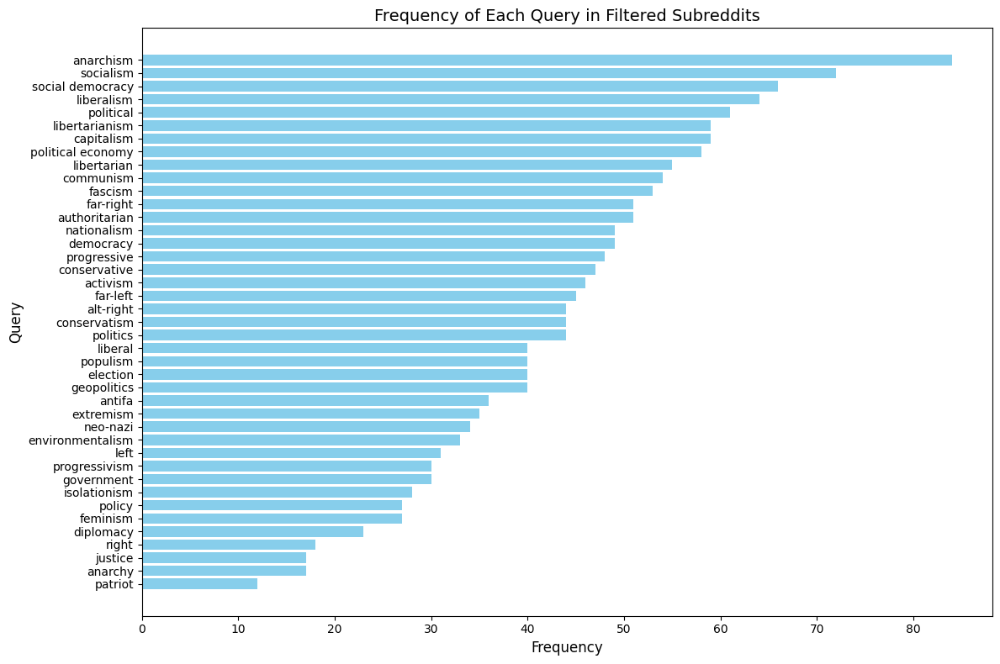

Query frequencies salvate in 'query_frequencies.csv'


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Carica il dataset
file_path = 'filtered_subreddits.csv'
df = pd.read_csv(file_path)

# Conta il numero di volte che ogni keyword appare nella lista 'query_type'
query_counts = {}
for query_list in df['query_type']:
    if isinstance(query_list, str):  # Verifica che non ci siano valori NaN
        # Rimuovi eventuali spazi superflui e suddividi in lista
        keywords = [keyword.strip() for keyword in query_list.strip("[]").replace("'", "").split(',')]
        for keyword in keywords:
            if keyword in query_counts:
                query_counts[keyword] += 1
            else:
                query_counts[keyword] = 1

# Converti il dizionario in un DataFrame per una migliore visualizzazione
query_df = pd.DataFrame(list(query_counts.items()), columns=['Query', 'Count']).sort_values(by='Count', ascending=False)

# Visualizza il risultato come grafico a barre
plt.figure(figsize=(12, 8))
plt.barh(query_df['Query'], query_df['Count'], color='skyblue')
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Query', fontsize=12)
plt.title('Frequency of Each Query in Filtered Subreddits', fontsize=14)
plt.gca().invert_yaxis()  # Inverti l'asse y per mostrare i più frequenti in alto
plt.tight_layout()
plt.show()

# Salva il risultato in un file CSV per un controllo ulteriore
query_df.to_csv("query_frequencies.csv", index=False)
print("Query frequencies salvate in 'query_frequencies.csv'")


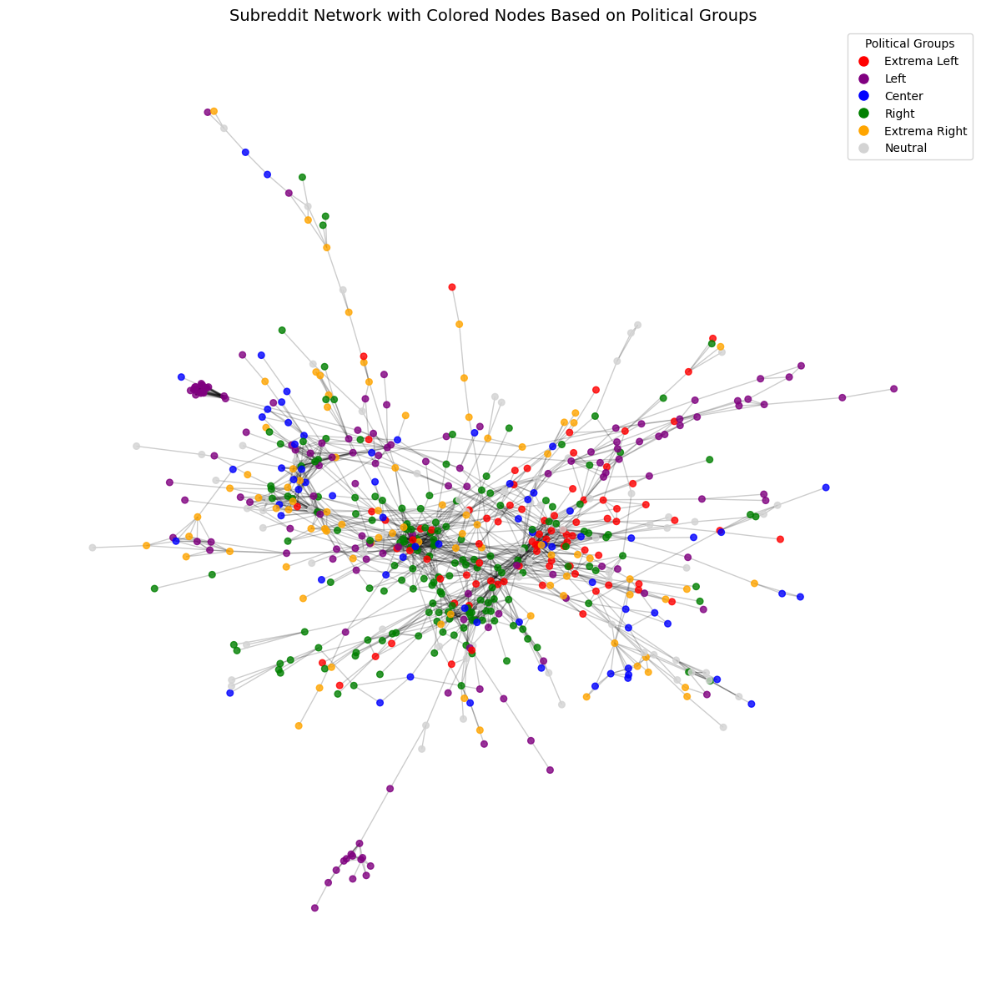

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import re
from matplotlib.lines import Line2D

# Definizione dei gruppi politici e dei colori associati
political_groups = {
    'Extrema Left': {'keywords': ['anarchism', 'socialism', 'communism', 'far-left'], 'color': 'red'},
    'Left': {'keywords': ['progressive', 'feminism', 'environmentalism', 'activism', 'social democracy'], 'color': 'purple'},
    'Center': {'keywords': ['political', 'policy', 'diplomacy', 'justice', 'geopolitics', 'political economy'], 'color': 'blue'},
    'Right': {'keywords': ['capitalism', 'libertarian', 'conservatism', 'liberalism'], 'color': 'green'},
    'Extrema Right': {'keywords': ['nationalism', 'alt-right', 'far-right', 'neo-nazi', 'extremism', 'authoritarian', 'fascism'], 'color': 'orange'},
    'Neutral': {'keywords': [], 'color': 'lightgray'}
}

# Funzione per assegnare il colore ai nodi in base ai gruppi politici e aggiornare il grafo
def assign_colors_to_nodes(G):
    for node in G.nodes:
        node_attributes = G.nodes[node]
        description = node_attributes.get('description', '').lower()
        query_list = node_attributes.get('query_type', [])
        relevant_words = set(re.findall(r'\w+', description)) | set(query_list)
        for group in ['Right', 'Left', 'Extrema Right', 'Extrema Left', 'Center', 'Neutral']:
            if set(political_groups[group]['keywords']) & relevant_words:
                G.nodes[node]['color'] = political_groups[group]['color']
                break
        if 'color' not in G.nodes[node]:
            G.nodes[node]['color'] = 'lightgray'

# Aggiunta della legenda al grafico
def add_legend():
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label=group,
               markerfacecolor=political_groups[group]['color'], markersize=10)
        for group in political_groups
    ]
    plt.legend(handles=legend_elements, loc='upper right', fontsize=10, title="Political Groups")

# Visualizzazione del grafo con colori e legenda
def visualize_network_with_colors_and_legend(G, figsize=(15, 15)):
    pos = nx.spring_layout(G, seed=42)
    node_colors = [G.nodes[node]['color'] for node in G.nodes()]
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, pos, node_size=30, node_color=node_colors, alpha=0.8)
    nx.draw_networkx_edges(G, pos, alpha=0.2)
    plt.title("Subreddit Network with Colored Nodes Based on Political Groups", fontsize=14)
    plt.axis("off")
    add_legend()  # Aggiunge la legenda
    plt.show()

# Assumendo che G_filtered sia il tuo grafo già preparato
assign_colors_to_nodes(G_filtered)
visualize_network_with_colors_and_legend(G_filtered)


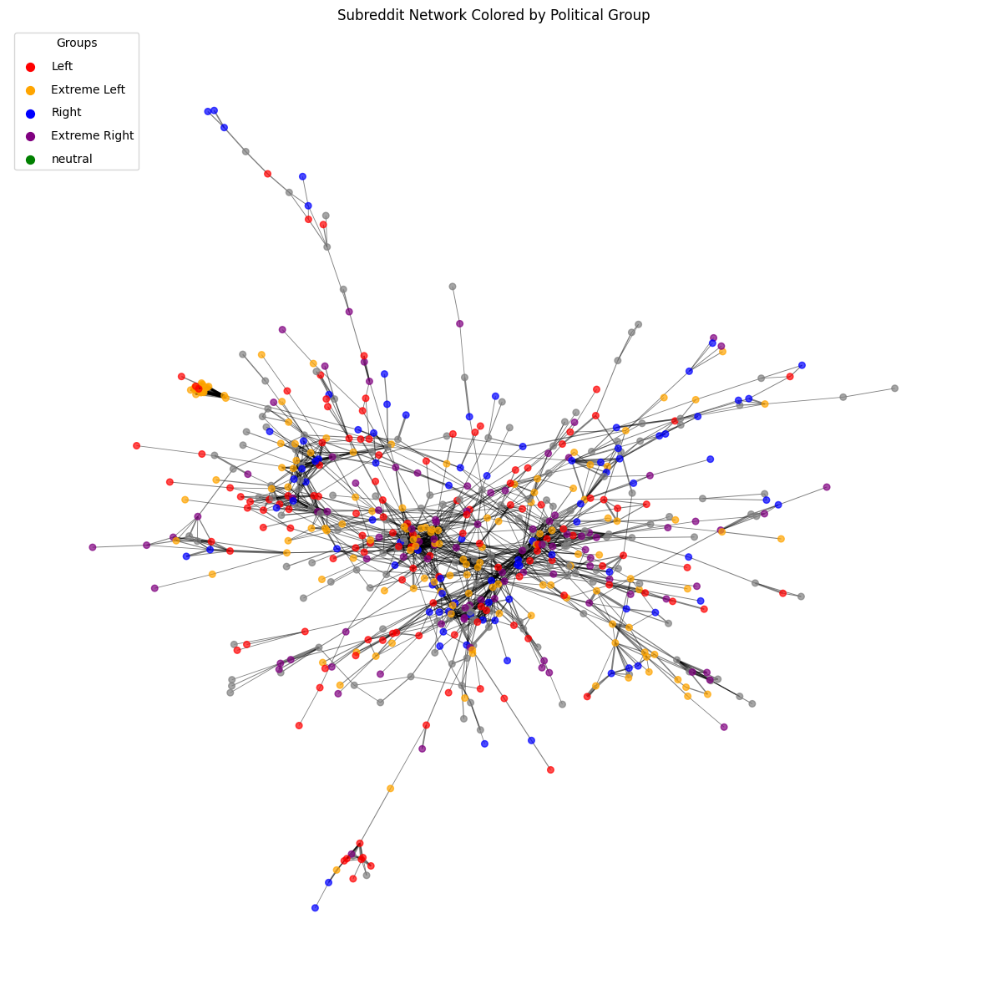

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

# Load the categories from subreddit_categories.csv
categories_file_path = 'subreddit_categories_ext.csv'
subreddit_categories = pd.read_csv(categories_file_path)

# Create a mapping of subreddit IDs to their categories
category_map = dict(zip(subreddit_categories['id'], subreddit_categories['category']))

# Map the categories to broader groups
#category_to_group = {
#    "Left-Libertarian": "left",
#    "Right-Libertarian": "right",
#    "Left-Authoritarian": "left",
#    "Right-Authoritarian": "right",
#}

# Default group for unmapped or missing categories
default_group = "center"

# Assign a group to each node in the graph based on the category map
def assign_group_by_category(node):
    id = subreddits[node]["id"]
    category = category_map.get(id, None)
    if category is None:
        return default_group
    return category

# Add group attribute to each node in the graph
for node in G_filtered.nodes:
    group = assign_group_by_category(node)
    G_filtered.nodes[node]["group"] = group

# Visualize the network with nodes colored by group
def visualize_network_by_group(G, figsize=(15, 15)):
    pos = nx.spring_layout(G, seed=42)
    
    # Get groups and their corresponding colors
    groups = nx.get_node_attributes(G, "group")
    colors = {"Left": "red", "Extreme Left": "orange", "Right": "blue", "Extreme Right": "purple", "center": "green", "neutral": "green"}
    node_colors = [colors.get(groups[node], "gray") for node in G.nodes]

    # Draw nodes
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, pos, node_size=30, node_color=node_colors, alpha=0.7)
    
    # Draw edges
    weights = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edges(G, pos, width=[0.1 + 0.05 * weights[edge] for edge in G.edges], alpha=0.5)
    
    # Add legend

    legend_labels = {"red": "Left",  "orange":"Extreme Left", "blue": "Right", "purple":"Extreme Right", "green": "center", "green": "neutral"}

    for color, label in legend_labels.items():
        plt.scatter([], [], c=color, label=label, s=50)
    plt.legend(scatterpoints=1, frameon=True, labelspacing=1, loc='upper left', title="Groups")
    
    plt.title("Subreddit Network Colored by Political Group", fontsize=12)
    plt.axis("off")
    plt.show()

# Visualize the network
visualize_network_by_group(G_filtered)

In [ ]:
num_nodes = G_filtered.number_of_nodes()
num_edges = G_filtered.number_of_edges()

print(f"Numero di nodi (nodes): {num_nodes}")
print(f"Numero di archi (edges): {num_edges}")

Numero di nodi (nodes): 930
Numero di archi (edges): 3403


Numero di comunità rilevate (Greedy Modularity): 22
Numero di comunità rilevate (Label Propagation): 81


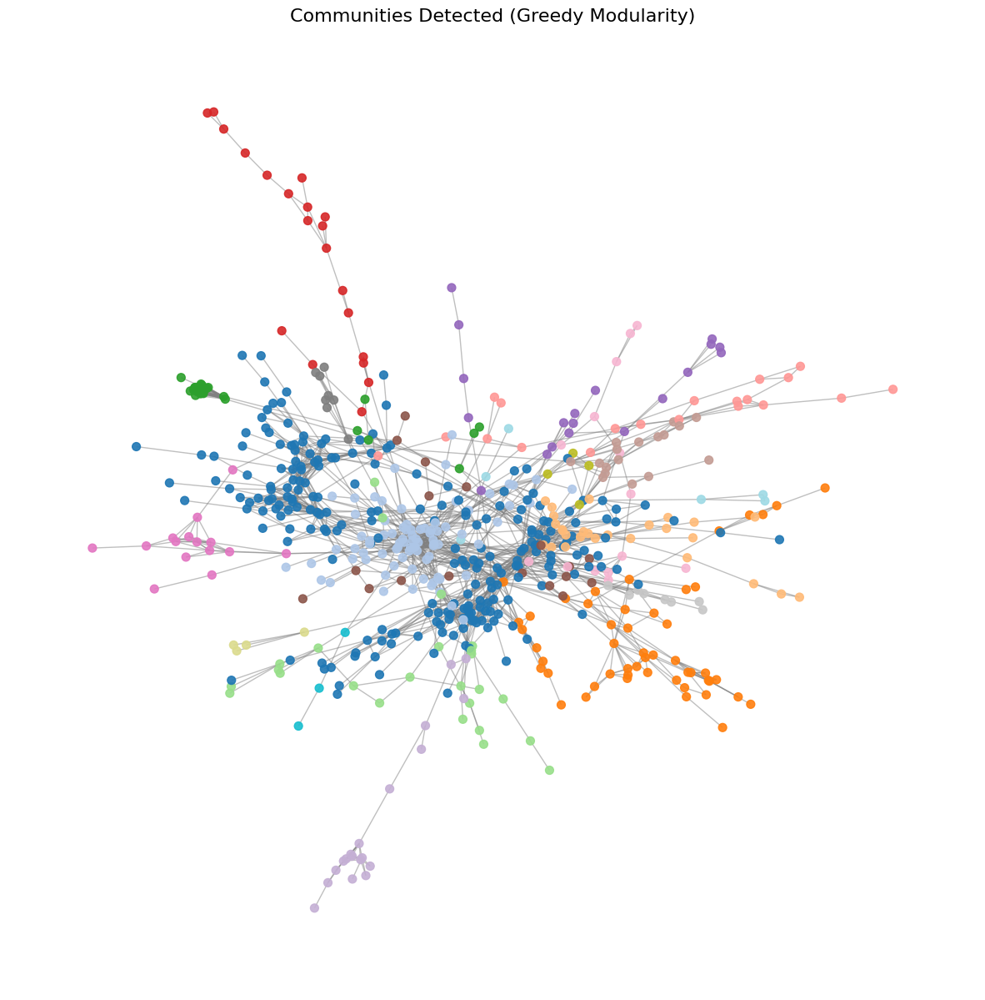

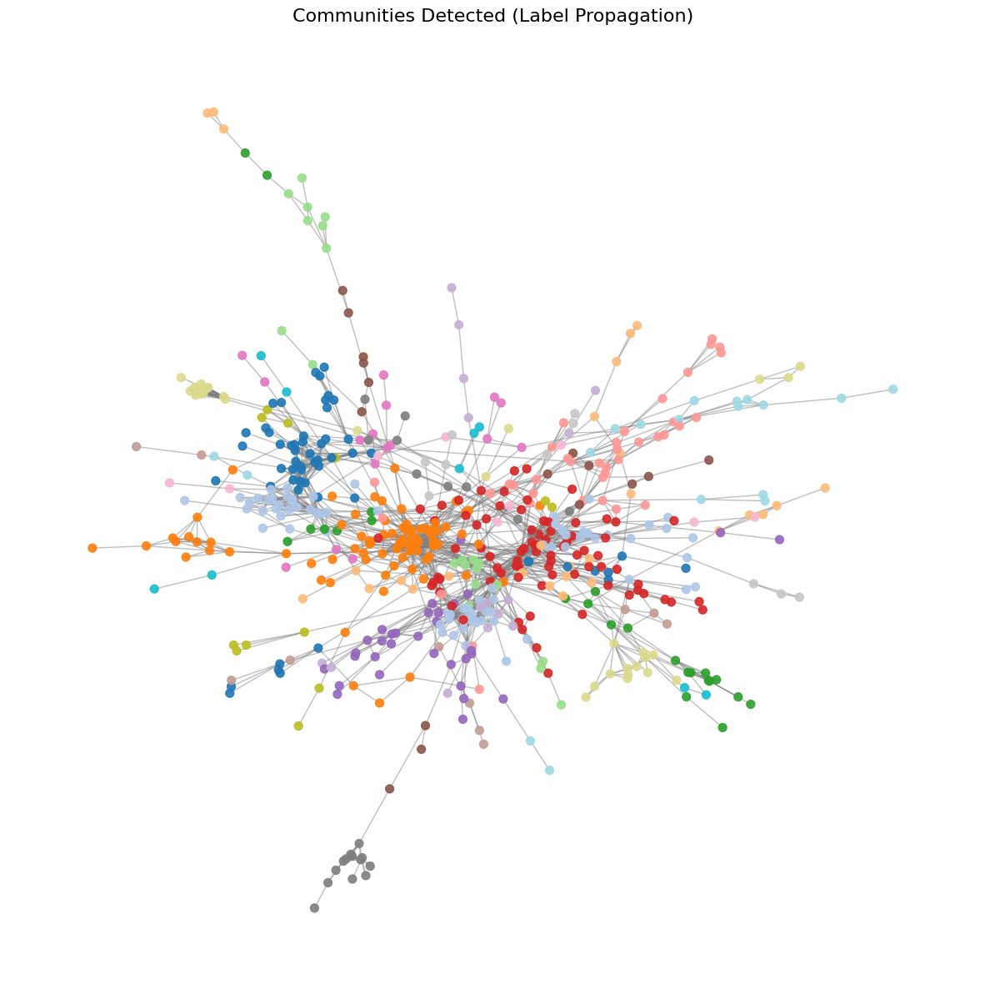

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities, label_propagation_communities

# Funzione per rilevare le comunità
def detect_communities(G):
    # Greedy modularity maximization
    greedy_communities = list(greedy_modularity_communities(G))
    print(f"Numero di comunità rilevate (Greedy Modularity): {len(greedy_communities)}")

    # Label propagation
    label_propagation = list(label_propagation_communities(G))
    print(f"Numero di comunità rilevate (Label Propagation): {len(label_propagation)}")

    return greedy_communities, label_propagation

# Visualizzazione delle comunità
def visualize_communities(G, communities, title):
    pos = nx.spring_layout(G, seed=42)
    
    # Assegna un colore unico a ciascuna comunità
    community_colors = {node: i for i, community in enumerate(communities) for node in community}
    node_colors = [community_colors[node] for node in G.nodes]

    # Disegna il grafo
    plt.figure(figsize=(15, 15))
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.tab20, node_size=50, alpha=0.9)
    nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)
    plt.title(title, fontsize=16)
    plt.axis("off")
    plt.show()

# Esegui la community detection
greedy_communities, label_propagation = detect_communities(G_filtered)

# Visualizza le comunità rilevate
visualize_communities(G_filtered, greedy_communities, "Communities Detected (Greedy Modularity)")
visualize_communities(G_filtered, label_propagation, "Communities Detected (Label Propagation)")


Numero di comunità rilevate (Greedy Modularity): 22
Numero di comunità rilevate (Label Propagation): 81
Community 1: {'Extrema Left': 43, 'Left': 9, 'Center': 5, 'Right': 55, 'Extrema Right': 8, 'Neutral': 8}
Community 2: {'Extrema Left': 2, 'Left': 27, 'Center': 19, 'Right': 19, 'Extrema Right': 22, 'Neutral': 15}
Community 3: {'Extrema Left': 15, 'Left': 9, 'Center': 7, 'Right': 40, 'Extrema Right': 7, 'Neutral': 5}
Community 4: {'Extrema Left': 3, 'Left': 3, 'Center': 14, 'Right': 7, 'Extrema Right': 10, 'Neutral': 14}
Community 5: {'Extrema Left': 3, 'Left': 1, 'Center': 7, 'Right': 8, 'Extrema Right': 1, 'Neutral': 8}
Community 6: {'Extrema Left': 1, 'Left': 23, 'Center': 2, 'Right': 0, 'Extrema Right': 0, 'Neutral': 0}
Community 7: {'Extrema Left': 1, 'Left': 5, 'Center': 6, 'Right': 8, 'Extrema Right': 1, 'Neutral': 4}
Community 8: {'Extrema Left': 1, 'Left': 2, 'Center': 2, 'Right': 4, 'Extrema Right': 6, 'Neutral': 5}
Community 9: {'Extrema Left': 0, 'Left': 16, 'Center': 0, '

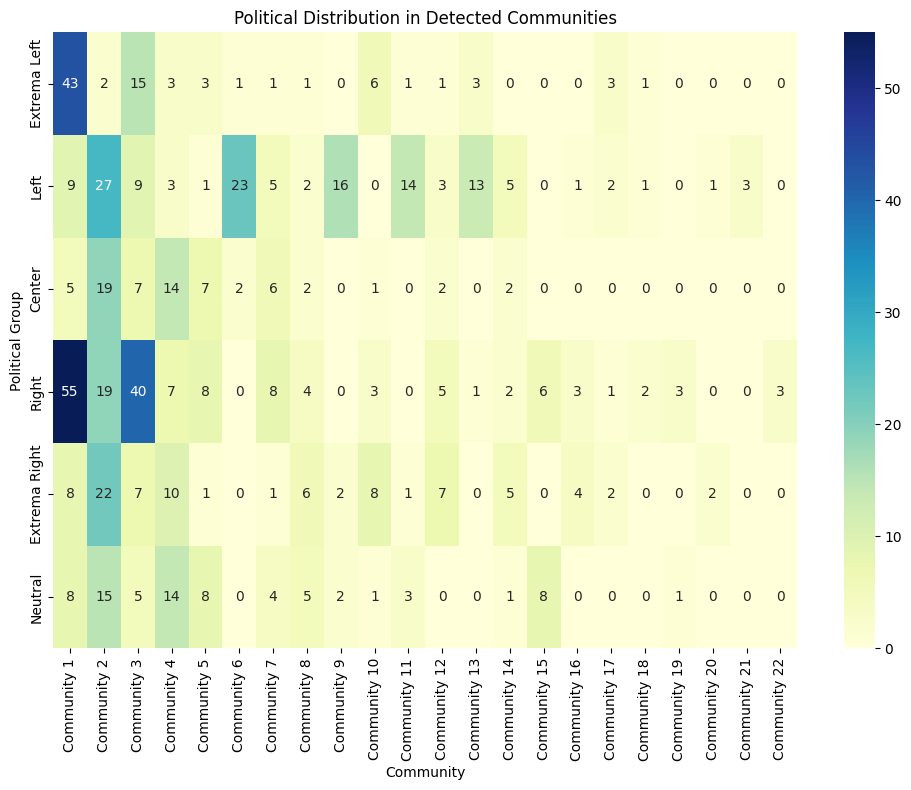

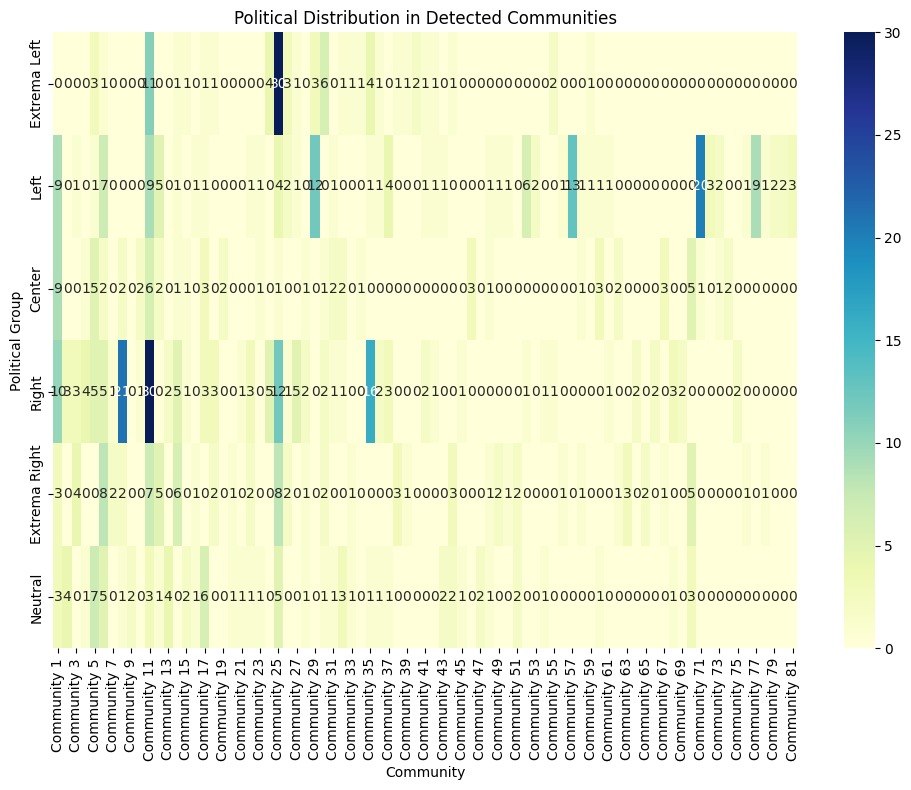

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import seaborn as sns

def analyze_political_distribution(G, communities):
    # Inizializza un dizionario per tracciare la distribuzione politica per ogni community
    political_distribution = []

    # Ciclo su ciascuna community
    for i, community in enumerate(communities):
        community_distribution = {group: 0 for group in political_groups}  # Dizionario per contare le categorie politiche
        for node in community:
            color = G.nodes[node]['color']  # Assumi che 'color' sia già stato assegnato come attributo
            for group, info in political_groups.items():
                if info['color'] == color:
                    community_distribution[group] += 1
                    break
        
        # Aggiungi il conteggio della community attuale al dizionario generale
        political_distribution.append(community_distribution)
        print(f"Community {i + 1}: {community_distribution}")

    return political_distribution

def plot_political_distribution(distributions):
    # Converte il dizionario in DataFrame per una facile visualizzazione
    df = pd.DataFrame(distributions)
    df.index = [f'Community {i+1}' for i in range(len(distributions))]  # Etichette per le comunità
    plt.figure(figsize=(12, 8))
    sns.heatmap(df.T, annot=True, cmap="YlGnBu", fmt="d")  # Trasposta per meglio visualizzare
    plt.title("Political Distribution in Detected Communities")
    plt.ylabel("Political Group")
    plt.xlabel("Community")
    plt.show()

# Esegui la community detection (assumi che G_filtered sia definito e che le community siano state trovate)
greedy_communities, label_propagation = detect_communities(G_filtered)

# Analizza la distribuzione politica
greedy_distribution = analyze_political_distribution(G_filtered, greedy_communities)
label_distribution = analyze_political_distribution(G_filtered, label_propagation)

# Visualizza le distribuzioni
plot_political_distribution(greedy_distribution)
plot_political_distribution(label_distribution)


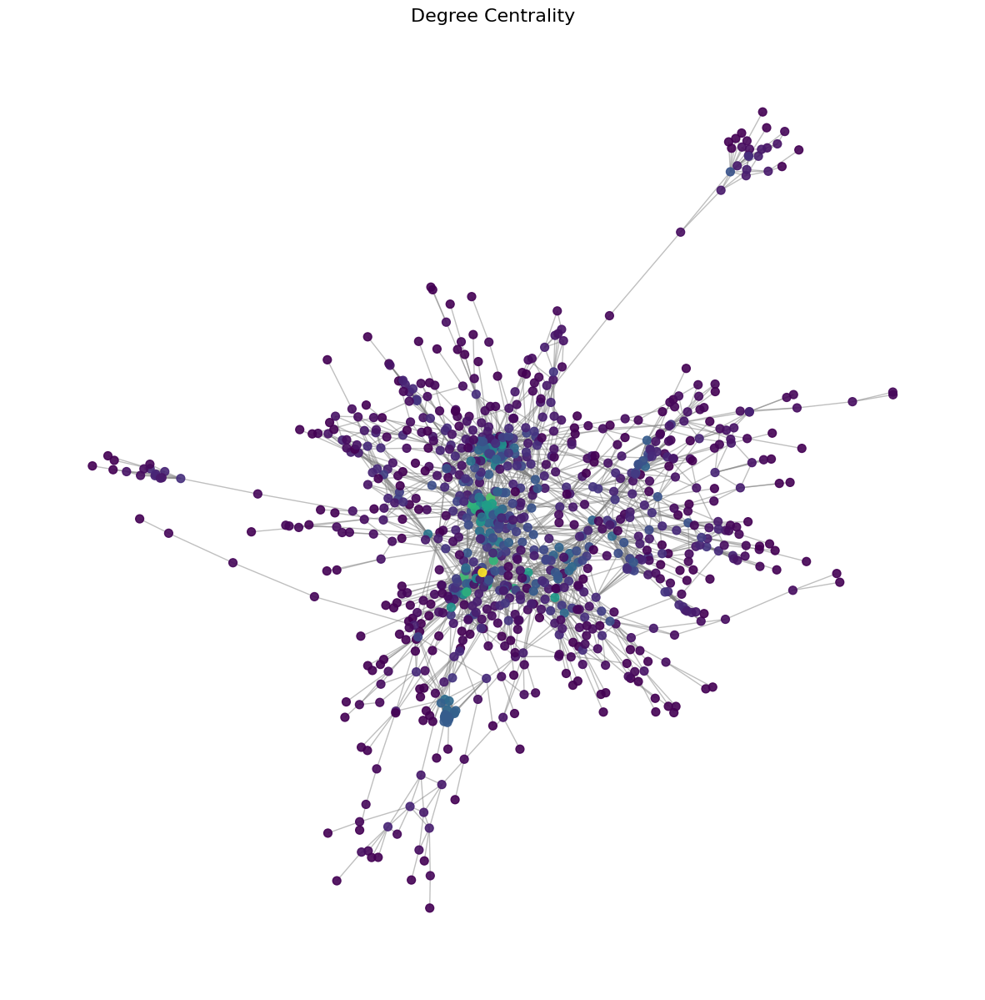

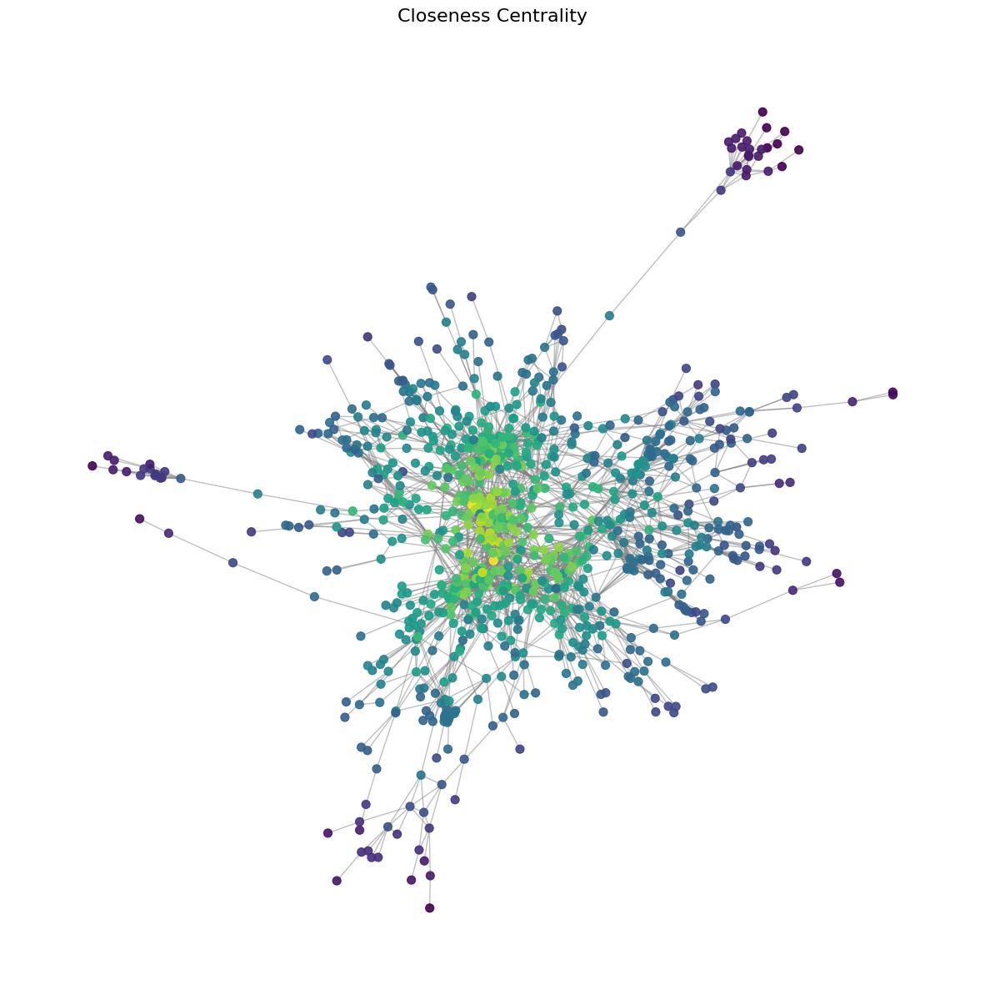

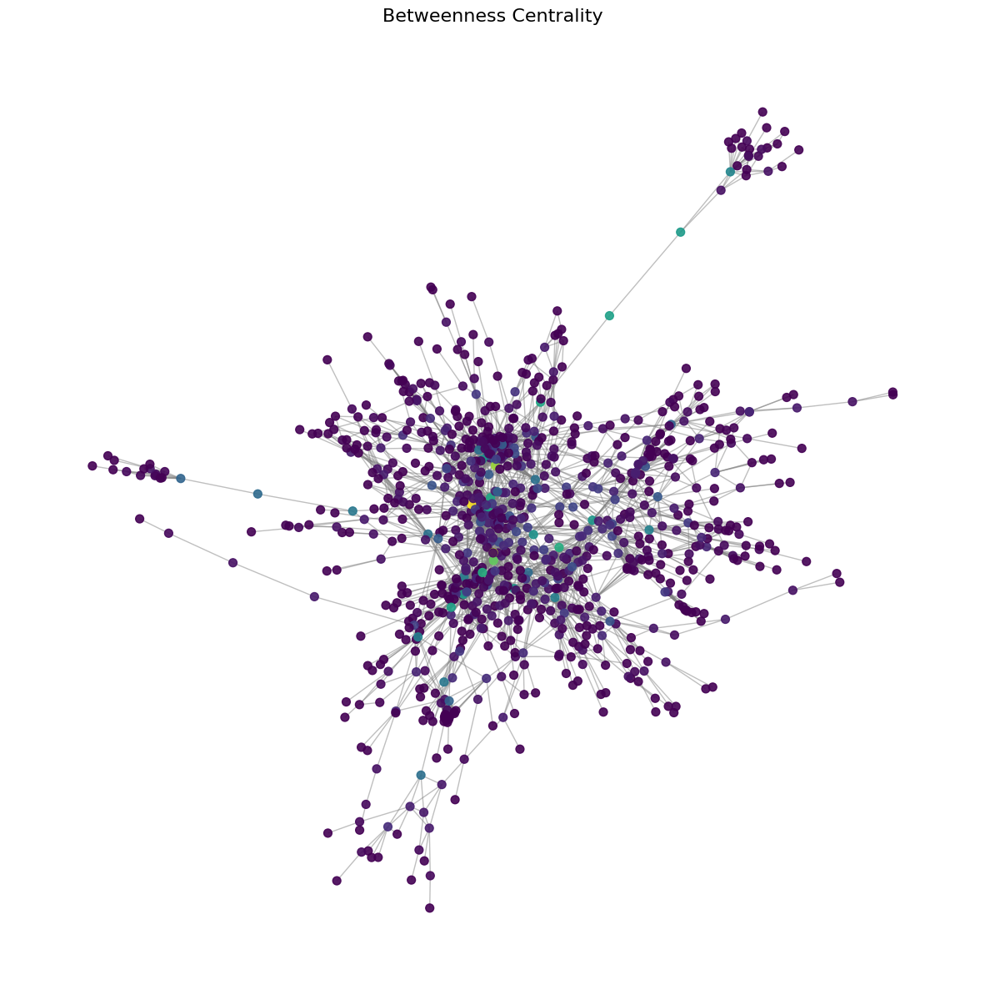

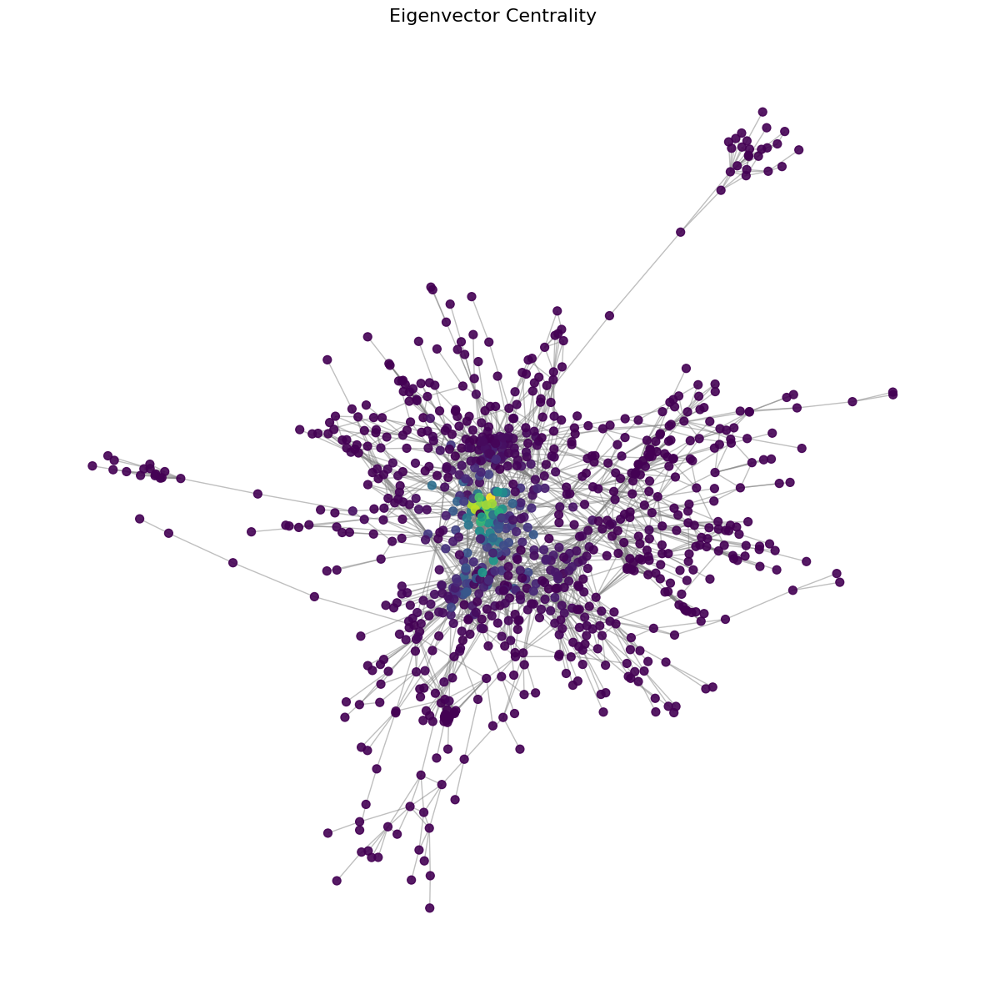

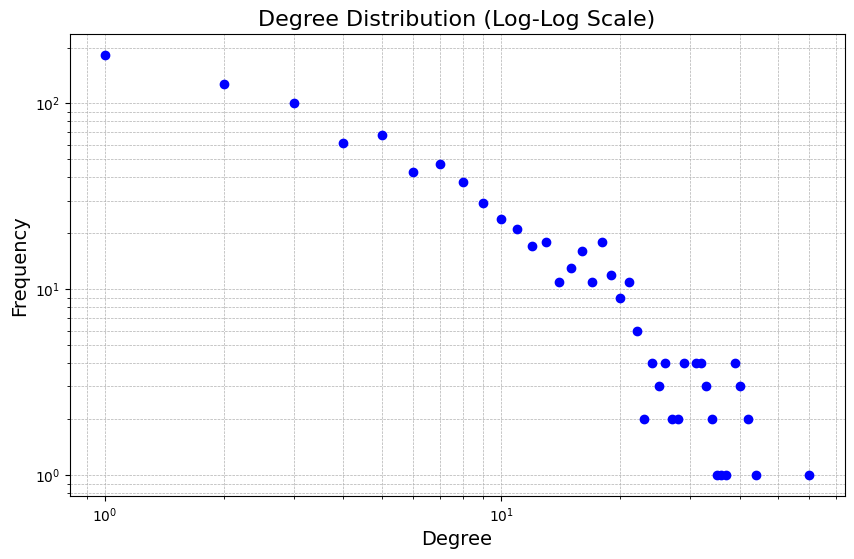

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

# Calculate and plot centrality measures
def calculate_and_visualize_centrality_measures(G):
    # Calculate centrality measures
    degree_centrality = nx.degree_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G, normalized=True)
    eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

    # Visualize networks with nodes colored by centrality
    visualize_centrality(G, degree_centrality, "Degree Centrality")
    visualize_centrality(G, closeness_centrality, "Closeness Centrality")
    visualize_centrality(G, betweenness_centrality, "Betweenness Centrality")
    visualize_centrality(G, eigenvector_centrality, "Eigenvector Centrality")

    # Plot degree distribution in log scale
    plot_degree_distribution(G)

# Visualize network with centrality coloring
def visualize_centrality(G, centrality, title):
    pos = nx.spring_layout(G, seed=42)
    
    # Normalize centrality values for better color scaling
    centrality_values = np.array(list(centrality.values()))
    normalized_centrality = (centrality_values - centrality_values.min()) / (centrality_values.max() - centrality_values.min())

    plt.figure(figsize=(15, 15))
    nx.draw_networkx_nodes(G, pos, node_color=normalized_centrality, cmap=plt.cm.viridis, node_size=50, alpha=0.9)
    nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)

    plt.title(title, fontsize=16)
    plt.axis("off")
    plt.show()

# Plot degree distribution in log scale
def plot_degree_distribution(G):
    degrees = [deg for _, deg in G.degree()]
    degree_counts = np.bincount(degrees)
    degrees = np.arange(len(degree_counts))

    plt.figure(figsize=(10, 6))
    plt.loglog(degrees[degree_counts > 0], degree_counts[degree_counts > 0], marker='o', linestyle='None', color='blue')
    plt.title("Degree Distribution (Log-Log Scale)", fontsize=16)
    plt.xlabel("Degree", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.show()

# Calculate and visualize all requested measures and plots
calculate_and_visualize_centrality_measures(G_filtered)


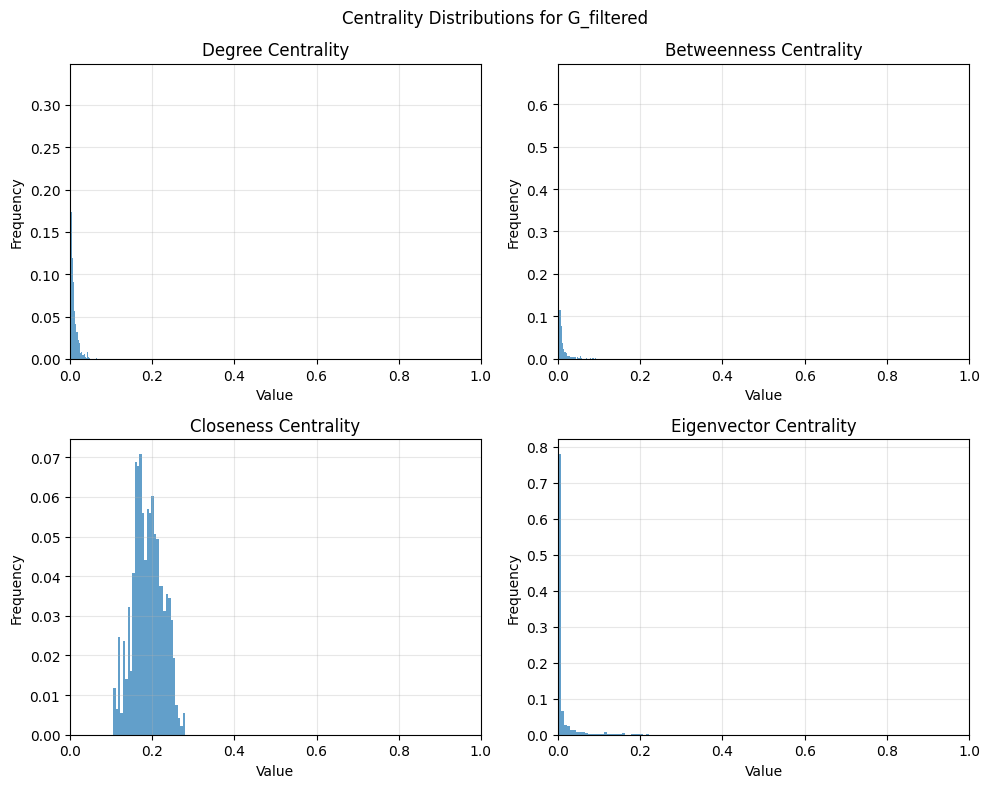

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

# Function to calculate centralities
def calculate_centralities(G):
    degree_dic = nx.degree_centrality(G)
    betwns_dic = nx.betweenness_centrality(G)
    closen_dic = nx.closeness_centrality(G)
    eigenv_dic = nx.eigenvector_centrality(G, max_iter=500, tol=1e-06)
    
    degree = list(degree_dic.values())
    betwns = list(betwns_dic.values())
    closen = list(closen_dic.values())
    eigenv = list(eigenv_dic.values())
    
    return degree, betwns, closen, eigenv

# Centrality names and titles for plotting
centrality_titles = [
    ('degree', "Degree Centrality"),
    ('betweenness', "Betweenness Centrality"),
    ('closeness', "Closeness Centrality"),
    ('eigenvector', "Eigenvector Centrality")
]

# Calculate centralities for G_filtered
degree, betwns, closen, eigenv = calculate_centralities(G_filtered)

# Store centralities in a dictionary for easier access
centralities = {
    'degree': degree,
    'betweenness': betwns,
    'closeness': closen,
    'eigenvector': eigenv
}

# Create a figure with 2x2 subplots for centrality distributions
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
fig.suptitle('Centrality Distributions for G_filtered')

# Loop through centralities and plot their distributions
for ax, (centrality_key, centrality_title) in zip(axs.flatten(), centrality_titles):
    data = centralities[centrality_key]
    
    # Calculate the histogram
    counts, bins = np.histogram(data, bins=30)
    
    # Normalize the histogram
    normalized_counts = counts / sum(counts)

    # Plot the normalized frequency distribution as a bar chart
    ax.bar(bins[:-1], normalized_counts, width=np.diff(bins), align="edge", alpha=0.7)
    
    # Set labels and title for each subplot
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.set_title(centrality_title)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, )
    ax.grid(True, alpha=0.3)

fig.tight_layout()
plt.show()


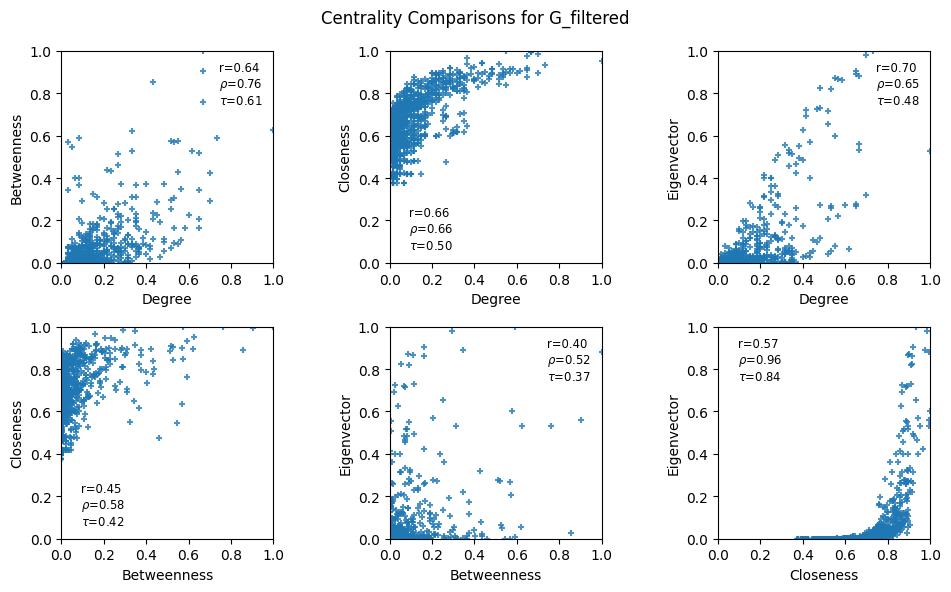

In [ ]:
import scipy.stats as sp

# Data pairs for plotting
plot_pairs = [
    ('degree', 'betweenness', 'Degree', 'Betweenness'),
    ('degree', 'closeness', 'Degree', 'Closeness'),
    ('degree', 'eigenvector', 'Degree', 'Eigenvector'),
    ('betweenness', 'closeness', 'Betweenness', 'Closeness'),
    ('betweenness', 'eigenvector', 'Betweenness', 'Eigenvector'),
    ('closeness', 'eigenvector', 'Closeness', 'Eigenvector')
]

# Calculate centralities for G_filtered
degree, betwns, closen, eigenv = calculate_centralities(G_filtered)

# Centralities dictionary
centralities = {
    'degree': degree,
    'betweenness': betwns,
    'closeness': closen,
    'eigenvector': eigenv
}

# Plotting centralities comparisons
fig, axs = plt.subplots(2, 3, figsize=(10, 6))
fig.suptitle('Centrality Comparisons for G_filtered')

# Loop over the plot pairs and axes
for ax, (x_key, y_key, labex, labey) in zip(axs.flatten(), plot_pairs):
    # Get the x and y values
    x = centralities[x_key]
    y = centralities[y_key]
    
    # Calculate Pearson, Spearman, and Kendall correlations
    pea = sp.pearsonr(x, y)[0]
    spear = sp.spearmanr(x, y)[0]
    kend = sp.kendalltau(x, y)[0]
    
    # Plot scatter plot
    ax.scatter(np.array(x) / np.max(x), np.array(y) / np.max(y),
               label=f"r={pea:.2f}\n" + r"$\rho$" + f"={spear:.2f}\n" + r"$\tau$" + f"={kend:.2f}",
               s=20, alpha=0.8, marker='+')
    
    # Set labels
    ax.set_xlabel(labex)
    ax.set_ylabel(labey)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_aspect('equal')
    # Add legend
    ax.legend(loc='best', frameon=False, shadow=False, fontsize='small', handlelength=0, markerscale=0)

fig.tight_layout()
plt.show()


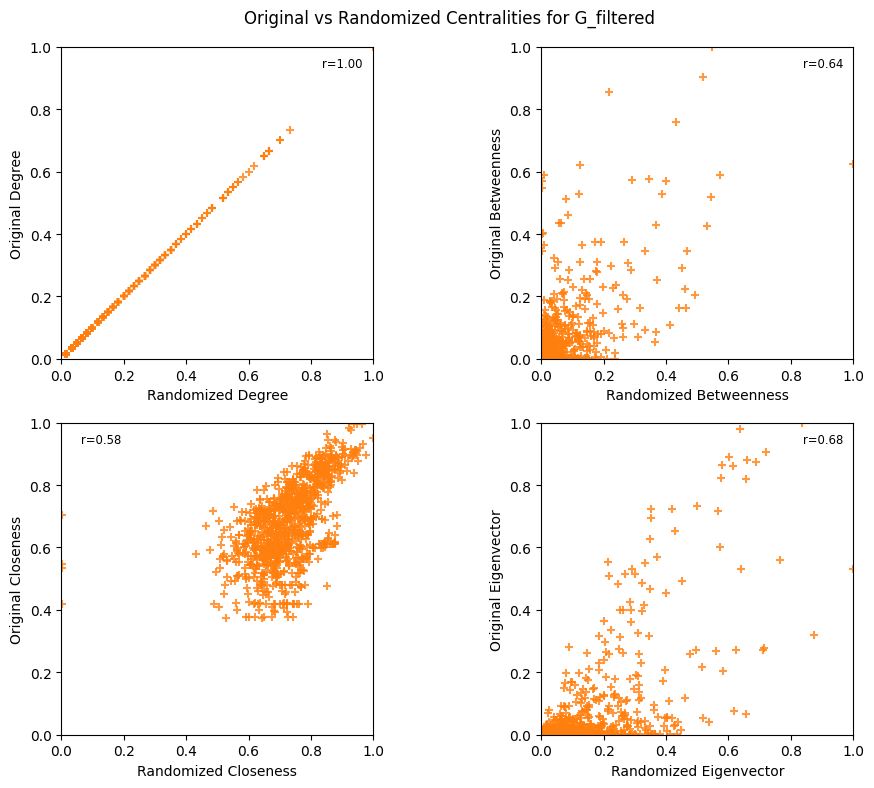

In [ ]:
# Function to compare original vs randomized centralities for G_filtered
def plot_original_vs_randomized_centralities(G, title):
    # Generate randomized graph
    Gr = nx.random_reference(G, niter=100, connectivity=False, seed=1234)
    
    # Calculate centralities for both original and randomized graphs
    degree, betwns, closen, eigenv = calculate_centralities(G)
    ran_degree, ran_betwns, ran_closen, ran_eigenv = calculate_centralities(Gr)
    
    # Centralities dictionary for original and randomized graphs
    centralities = {
        'degree': degree,
        'betweenness': betwns,
        'closeness': closen,
        'eigenvector': eigenv,
        'ran_degree': ran_degree,
        'ran_betweenness': ran_betwns,
        'ran_closeness': ran_closen,
        'ran_eigenvector': ran_eigenv
    }
    
    # Plotting pairs for original vs randomized comparisons
    randomized_pairs = [
        ('degree', 'ran_degree', 'Randomized Degree', 'Original Degree'),
        ('betweenness', 'ran_betweenness', 'Randomized Betweenness', 'Original Betweenness'),
        ('closeness', 'ran_closeness', 'Randomized Closeness', 'Original Closeness'),
        ('eigenvector', 'ran_eigenvector', 'Randomized Eigenvector', 'Original Eigenvector')
    ]
    
    # Create subplots for each comparison
    fig, axs = plt.subplots(2, 2, figsize=(10, 8))
    fig.suptitle(f'Original vs Randomized Centralities for {title}')
    
    # Loop over the randomized comparison pairs and axes
    for ax, (original_key, random_key, labex, labey) in zip(axs.flatten(), randomized_pairs):
        # Get the original and randomized values
        original_values = centralities[original_key]
        random_values = centralities[random_key]
        
        # Calculate Pearson correlation
        pea = sp.pearsonr(random_values, original_values)[0]
        
        # Plot scatter plot
        ax.scatter(np.array(random_values) / np.max(random_values), 
                   np.array(original_values) / np.max(original_values), 
                   label=f"r={pea:.2f}", alpha=0.8, marker='+', color='C1')
        
        # Set labels and limits
        ax.set_xlabel(labex, fontsize=10)
        ax.set_ylabel(labey, fontsize=10)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_aspect('equal')
        
        # Add legend
        ax.legend(loc='best', frameon=False, fontsize='small', handlelength=0, markerscale=0)
    
    # Adjust layout
    fig.tight_layout()
    plt.show()

# Execute the function for G_filtered
plot_original_vs_randomized_centralities(G_filtered, "G_filtered")


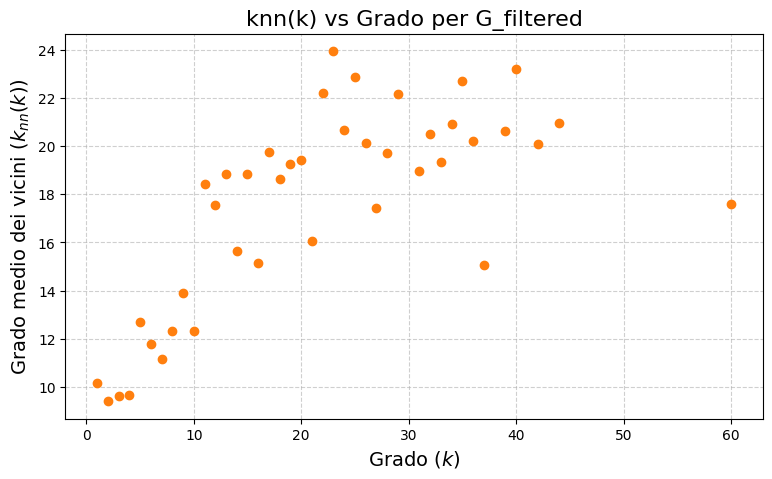

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calcola knn(k) per G_filtered e visualizza
def plot_knn_vs_degree_for_graph(G, title):
    # Calcola il grado di ogni nodo
    node_degrees = dict(G.degree())

    # Calcola il grado medio dei vicini per ogni nodo
    avg_neighbor_degree = nx.average_neighbor_degree(G)

    # Raggruppa per grado per calcolare knn(k)
    degree_knn = {}
    for node, degree in node_degrees.items():
        if degree not in degree_knn:
            degree_knn[degree] = []
        degree_knn[degree].append(avg_neighbor_degree[node])

    # Calcola il valore medio di knn(k) per ogni grado
    degrees = sorted(degree_knn.keys())
    knn_values = [np.mean(degree_knn[degree]) for degree in degrees]

    # Plot
    plt.figure(figsize=(9, 5))
    plt.plot(degrees, knn_values, 'o', color='C1', label="knn(k)")
    plt.xlabel("Grado ($k$)", fontsize=14)
    plt.ylabel("Grado medio dei vicini ($k_{nn}(k)$)", fontsize=14)
    plt.title(title, fontsize=16)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

# Esegui la funzione per G_filtered
plot_knn_vs_degree_for_graph(G_filtered, "knn(k) vs Grado per G_filtered")


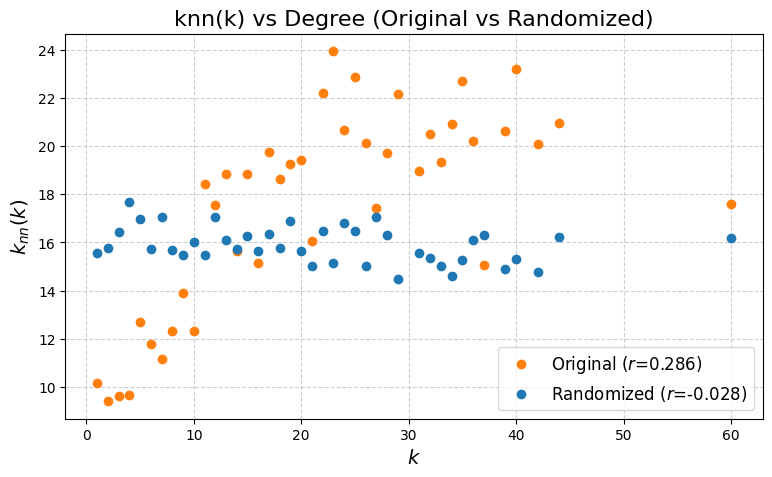

In [ ]:
# Funzione per plottare knn(k) e calcolare assortatività per grafo originale e randomizzato
def plot_knn_vs_degree_with_assortativity(G, title):
    # Original graph (og)
    node_degrees = dict(G.degree())
    avg_neighbor_degree = nx.average_neighbor_degree(G)
    degree_knn = {}

    # Group by degree to compute knn(k)
    for node, degree in node_degrees.items():
        if degree not in degree_knn:
            degree_knn[degree] = []
        degree_knn[degree].append(avg_neighbor_degree[node])

    degrees = sorted(degree_knn.keys())
    knn_values = [np.mean(degree_knn[degree]) for degree in degrees]

    # Assortativity coefficient for original graph
    assortativity = nx.degree_assortativity_coefficient(G)

    # Randomized graph (rnd)
    randomized_G = nx.algorithms.smallworld.random_reference(G, niter=100, connectivity=False)
    node_degrees_rnd = dict(randomized_G.degree())
    avg_neighbor_degree_rnd = nx.average_neighbor_degree(randomized_G)
    degree_knn_rnd = {}

    # Group by degree to compute knn(k) for randomized graph
    for node, degree in node_degrees_rnd.items():
        if degree not in degree_knn_rnd:
            degree_knn_rnd[degree] = []
        degree_knn_rnd[degree].append(avg_neighbor_degree_rnd[node])

    degrees_rnd = sorted(degree_knn_rnd.keys())
    knn_values_rnd = [np.mean(degree_knn_rnd[degree]) for degree in degrees_rnd]

    # Assortativity coefficient for randomized graph
    assortativity_rnd = nx.degree_assortativity_coefficient(randomized_G)

    # Plot
    plt.figure(figsize=(9, 5))
    plt.plot(degrees, knn_values, 'o', color='C1', label=f"Original ($r$={assortativity:.3f})")
    plt.plot(degrees_rnd, knn_values_rnd, 'o', color='C0', label=f"Randomized ($r$={assortativity_rnd:.3f})")
    plt.xlabel("$k$", fontsize=14)
    plt.ylabel("$k_{nn}(k)$", fontsize=14)
    plt.title(title, fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

# Esegui la funzione per G_filtered
plot_knn_vs_degree_with_assortativity(G_filtered, "knn(k) vs Degree (Original vs Randomized)")


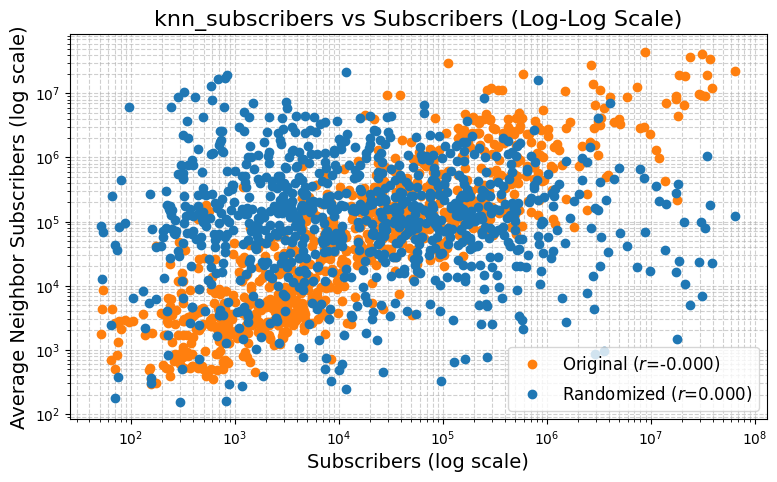

In [ ]:
# Funzione per calcolare e plottare l'autocorrelazione dei subscribers in scala log-log
def plot_knn_subscribers_vs_subscribers_loglog(G, title):
    # Estrai i valori di 'subscribers' dai nodi
    subscribers = nx.get_node_attributes(G, 'subscribers')
    
    # Calcola la media dei subscribers dei vicini
    avg_neighbor_subscribers = {}
    for node in G.nodes:
        neighbors = list(G.neighbors(node))
        if neighbors:
            avg_neighbor_subscribers[node] = np.mean([subscribers[neighbor] for neighbor in neighbors if neighbor in subscribers])
        else:
            avg_neighbor_subscribers[node] = 0

    # Raggruppa per numero di subscribers per calcolare knn_subscribers
    subscribers_knn = {}
    for node, sub_value in subscribers.items():
        if sub_value not in subscribers_knn:
            subscribers_knn[sub_value] = []
        subscribers_knn[sub_value].append(avg_neighbor_subscribers[node])

    # Calcola il valore medio di knn_subscribers per ogni livello di subscribers
    subscriber_levels = sorted(subscribers_knn.keys())
    knn_values = [np.mean(subscribers_knn[sub]) for sub in subscriber_levels]

    # Calcola assortativity coefficient
    assortativity = nx.numeric_assortativity_coefficient(G, 'subscribers')

    # Randomized graph
    randomized_G = nx.algorithms.smallworld.random_reference(G, niter=100, connectivity=False)
    random_avg_neighbor_subscribers = {}
    random_subscribers = nx.get_node_attributes(randomized_G, 'subscribers')
    
    # Calcola la media dei subscribers dei vicini nel grafo randomizzato
    for node in randomized_G.nodes:
        neighbors = list(randomized_G.neighbors(node))
        if neighbors:
            random_avg_neighbor_subscribers[node] = np.mean([random_subscribers[neighbor] for neighbor in neighbors if neighbor in random_subscribers])
        else:
            random_avg_neighbor_subscribers[node] = 0

    # Raggruppa per subscribers nel grafo randomizzato
    random_subscribers_knn = {}
    for node, sub_value in random_subscribers.items():
        if sub_value not in random_subscribers_knn:
            random_subscribers_knn[sub_value] = []
        random_subscribers_knn[sub_value].append(random_avg_neighbor_subscribers[node])

    random_subscriber_levels = sorted(random_subscribers_knn.keys())
    random_knn_values = [np.mean(random_subscribers_knn[sub]) for sub in random_subscriber_levels]

    # Calcola assortativity coefficient per il grafo randomizzato
    random_assortativity = nx.numeric_assortativity_coefficient(randomized_G, 'subscribers')

    # Plot in log-log scale
    plt.figure(figsize=(9, 5))
    plt.loglog(subscriber_levels, knn_values, 'o', color='C1', label=f"Original ($r$={assortativity:.3f})")
    plt.loglog(random_subscriber_levels, random_knn_values, 'o', color='C0', label=f"Randomized ($r$={random_assortativity:.3f})")
    plt.xlabel("Subscribers (log scale)", fontsize=14)
    plt.ylabel("Average Neighbor Subscribers (log scale)", fontsize=14)
    plt.title(title, fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True, which="both", linestyle='--', alpha=0.6)
    plt.show()

# Esegui la funzione per G_filtered
plot_knn_subscribers_vs_subscribers_loglog(G_filtered, "knn_subscribers vs Subscribers (Log-Log Scale)")


G_filtered - CNM: 22 communities detected.
Execution Time: 0.20s


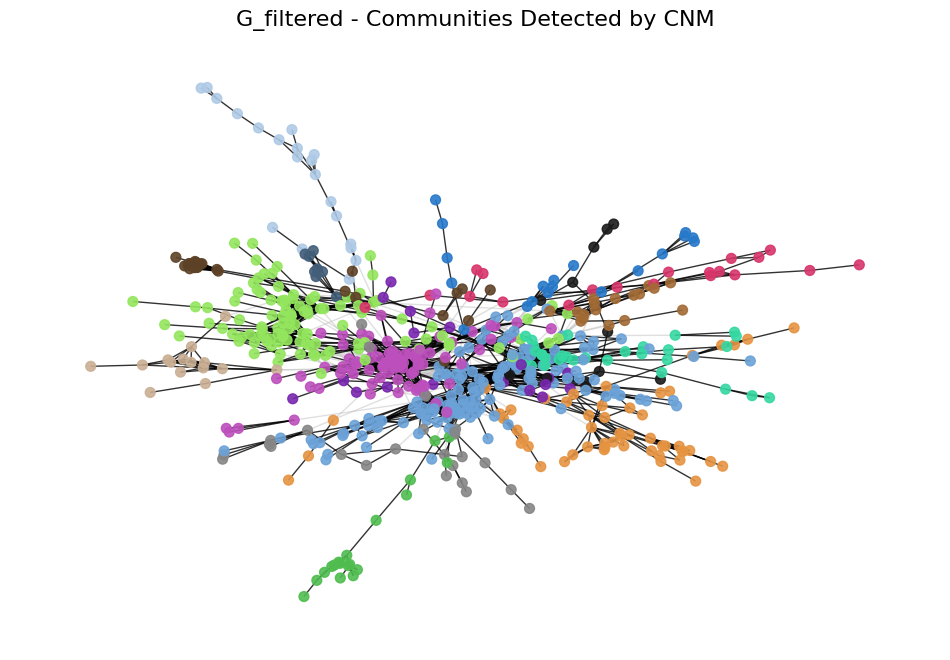

G_filtered - LP: 81 communities detected.
Execution Time: 0.02s


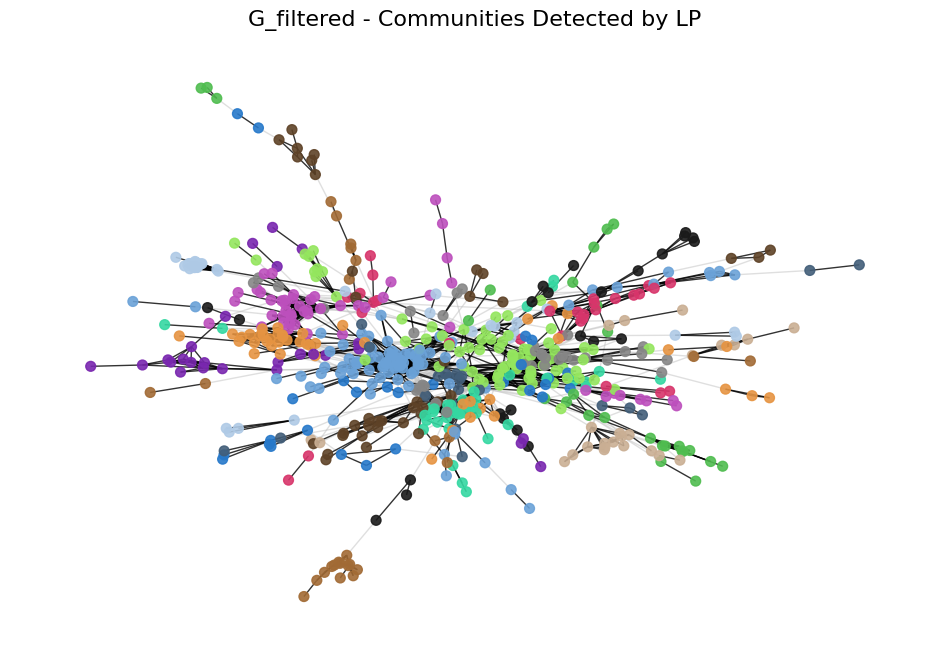

Randomized G_filtered - CNM: 11 communities detected.
Execution Time: 0.27s


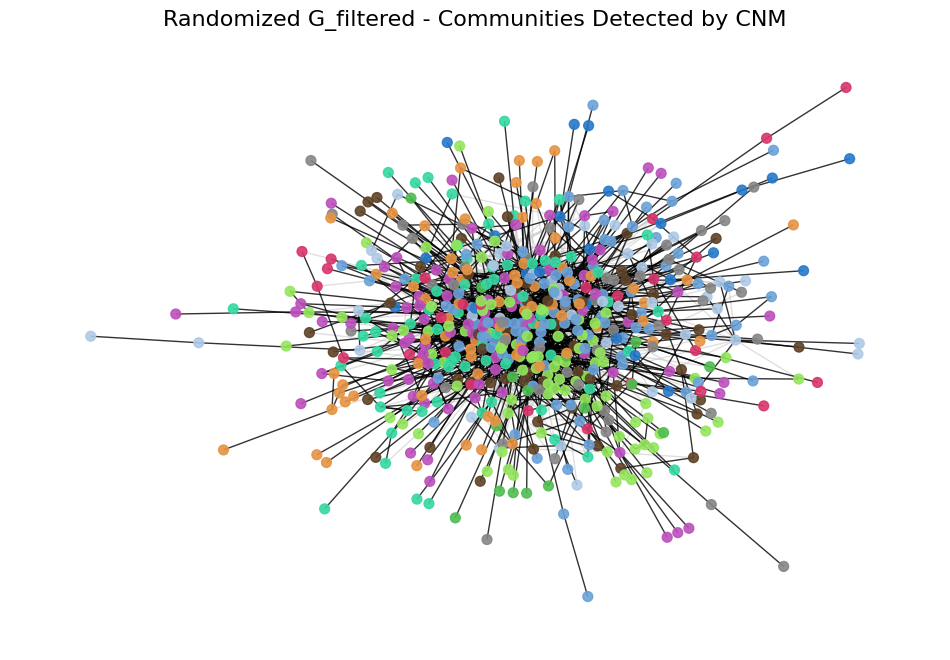

Randomized G_filtered - LP: 13 communities detected.
Execution Time: 0.02s


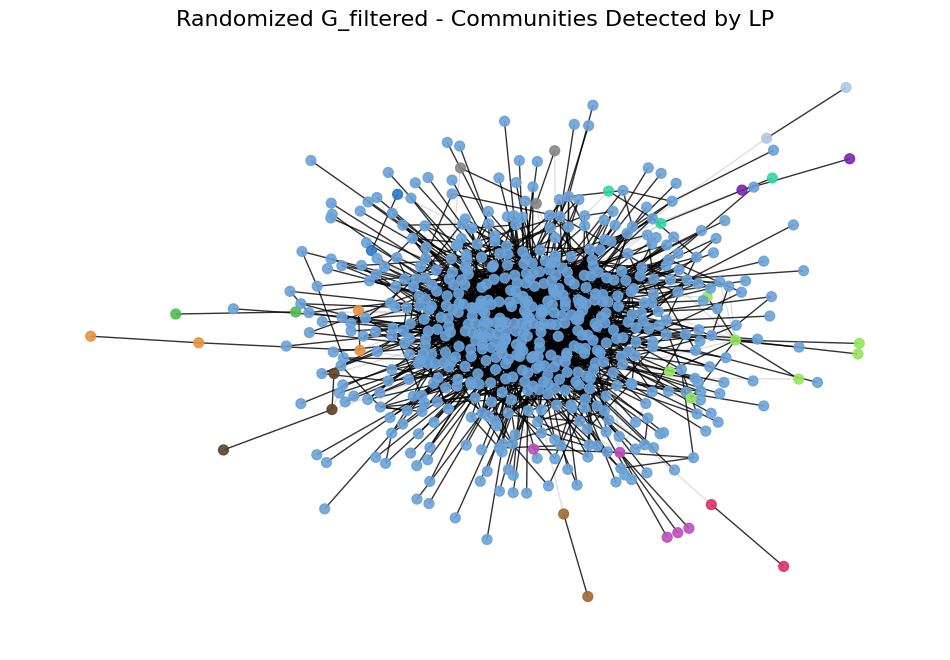

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import networkx.algorithms.community as nxcom
import pandas as pd
import json

import matplotlib as mpl
import time

# Apply community detection to both G_filtered and its randomized version
def community_detection_and_plot(G, title_prefix):
    """
    Perform community detection using CNM and LP and plot the results for a graph G.
    """
    def set_node_community(G, communities):
        """Add community to node attributes."""
        for c, v_c in enumerate(communities):
            for v in v_c:
                G.nodes[v]['community'] = c + 1

    def set_edge_community(G):
        """Find internal edges and add their community to their attributes."""
        for v, w in G.edges:
            if G.nodes[v]['community'] == G.nodes[w]['community']:
                G.edges[v, w]['community'] = G.nodes[v]['community']
            else:
                G.edges[v, w]['community'] = 0

    def get_color(i, r_off=1, g_off=1, b_off=1):
        """Assign a color to a vertex."""
        low, high = 0.1, 0.9
        span = high - low
        n = 16
        r = low + span * (((i + r_off) * 3) % n) / (n - 1)
        g = low + span * (((i + g_off) * 5) % n) / (n - 1)
        b = low + span * (((i + b_off) * 7) % n) / (n - 1)
        return (r, g, b)

    # CNM Community Detection
    start = time.time()
    communities_CNM = sorted(nxcom.greedy_modularity_communities(G), key=len, reverse=True)
    print(f"{title_prefix} - CNM: {len(communities_CNM)} communities detected.")
    print(f"Execution Time: {time.time() - start:.2f}s")
    
    set_node_community(G, communities_CNM)
    set_edge_community(G)
    
    pos = nx.spring_layout(G, seed=42)
    node_color = [get_color(G.nodes[v]['community']) for v in G.nodes]
    external = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] == 0]
    internal = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] > 0]
    internal_color = ['black' for _ in internal]

    plt.figure(figsize=(12, 8))
    nx.draw_networkx_edges(G, pos, edgelist=external, edge_color="silver", alpha=0.5)
    nx.draw_networkx_edges(G, pos, edgelist=internal, edge_color=internal_color, alpha=0.8)
    nx.draw_networkx_nodes(G, pos, node_color=node_color, node_size=50, alpha=0.9)
    plt.title(f"{title_prefix} - Communities Detected by CNM", fontsize=16)
    plt.axis("off")
    plt.show()

    # LP Community Detection
    start = time.time()
    communities_LP = [c for c in sorted(nxcom.label_propagation_communities(G), key=len, reverse=True)]
    print(f"{title_prefix} - LP: {len(communities_LP)} communities detected.")
    print(f"Execution Time: {time.time() - start:.2f}s")

    set_node_community(G, communities_LP)
    set_edge_community(G)

    node_color = [get_color(G.nodes[v]['community']) for v in G.nodes]
    external = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] == 0]
    internal = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] > 0]

    plt.figure(figsize=(12, 8))
    nx.draw_networkx_edges(G, pos, edgelist=external, edge_color="silver", alpha=0.5)
    nx.draw_networkx_edges(G, pos, edgelist=internal, edge_color=internal_color, alpha=0.8)
    nx.draw_networkx_nodes(G, pos, node_color=node_color, node_size=50, alpha=0.9)
    plt.title(f"{title_prefix} - Communities Detected by LP", fontsize=16)
    plt.axis("off")
    plt.show()


# Perform community detection on G_filtered
community_detection_and_plot(G_filtered, "G_filtered")

# Generate a randomized version of G_filtered and perform community detection
GR = nx.random_reference(G_filtered, niter=100, connectivity=False, seed=42)
community_detection_and_plot(GR, "Randomized G_filtered")


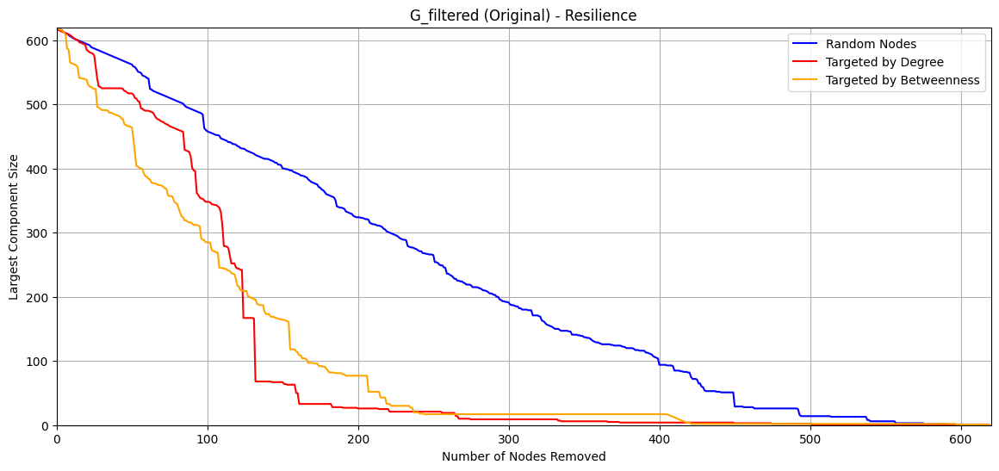

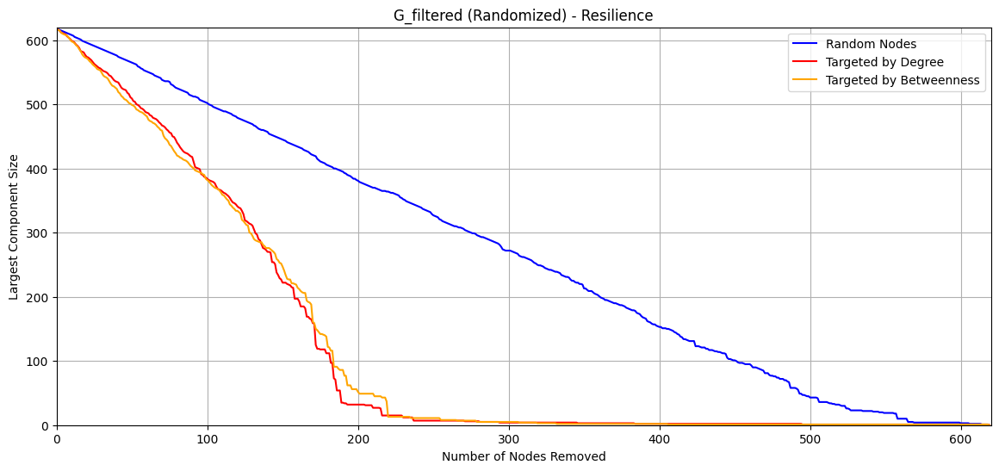

In [ ]:
def largest_component_size(graph):
    if graph.number_of_nodes() == 0:
        return 0
    return len(max(nx.connected_components(graph), key=len))

# Function to calculate and plot resilience for G_filtered and its randomized version
def plot_resilience_for_filtered_and_randomized(graph, title):
    # Randomized version of the graph
    randomized_graph = nx.random_reference(graph, niter=100, connectivity=False, seed=42)
    
    # Define a helper function for resilience plotting
    def plot_resilience(graph, title_suffix):
        num_nodes = graph.number_of_nodes()
        
        graph_random_nodes = graph.copy()
        graph_targeted_degree = graph.copy()
        graph_targeted_betweenness = graph.copy()

        random_node_sizes = []
        targeted_degree_sizes = []
        targeted_betweenness_sizes = []

        # Random node removal
        nodes = list(graph_random_nodes.nodes())
        np.random.shuffle(nodes)
        for node in nodes:
            graph_random_nodes.remove_node(node)
            random_node_sizes.append(largest_component_size(graph_random_nodes))

        # Targeted removal by degree
        nodes_by_degree = sorted(graph_targeted_degree.degree, key=lambda x: x[1], reverse=True)
        for node, _ in nodes_by_degree:
            graph_targeted_degree.remove_node(node)
            targeted_degree_sizes.append(largest_component_size(graph_targeted_degree))

        # Targeted removal by betweenness
        nodes_by_betweenness = sorted(nx.betweenness_centrality(graph_targeted_betweenness).items(), key=lambda x: x[1], reverse=True)
        for node, _ in nodes_by_betweenness:
            graph_targeted_betweenness.remove_node(node)
            targeted_betweenness_sizes.append(largest_component_size(graph_targeted_betweenness))

        # Plot results
        max_removals = max(len(random_node_sizes), len(targeted_degree_sizes), len(targeted_betweenness_sizes))

        plt.figure(figsize=(14, 6))
        plt.plot(range(len(random_node_sizes)), random_node_sizes, label="Random Nodes", color="blue")
        plt.plot(range(len(targeted_degree_sizes)), targeted_degree_sizes, label="Targeted by Degree", color="red")
        plt.plot(range(len(targeted_betweenness_sizes)), targeted_betweenness_sizes, label="Targeted by Betweenness", color="orange")
        plt.title(f"{title_suffix} - Resilience")
        plt.xlabel("Number of Nodes Removed")
        plt.ylabel("Largest Component Size")
        plt.xlim(0, max_removals)
        plt.ylim(0, num_nodes)
        plt.legend()
        plt.grid(True)
        plt.show()

    # Plot resilience for the original graph
    plot_resilience(graph, f"{title} (Original)")
    
    # Plot resilience for the randomized graph
    plot_resilience(randomized_graph, f"{title} (Randomized)")

# Perform resilience analysis on G_filtered and its randomized version
plot_resilience_for_filtered_and_randomized(G_filtered, "G_filtered")


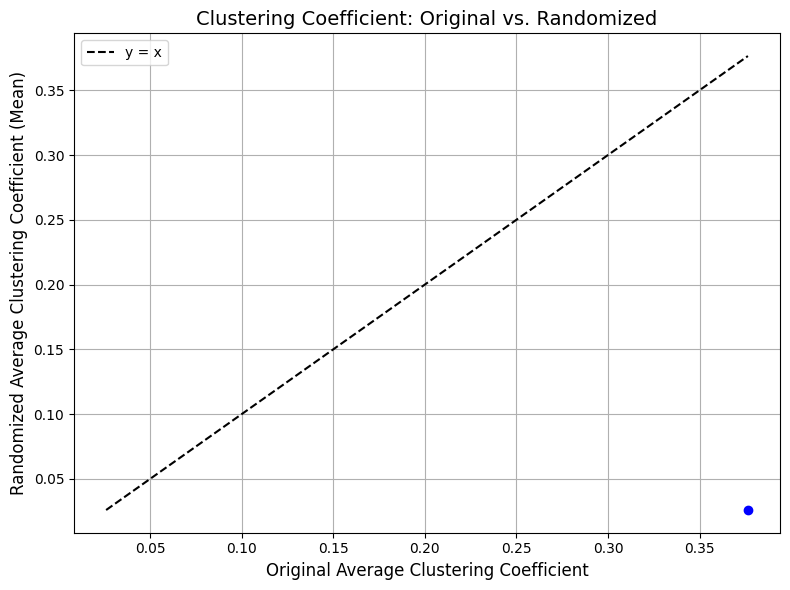

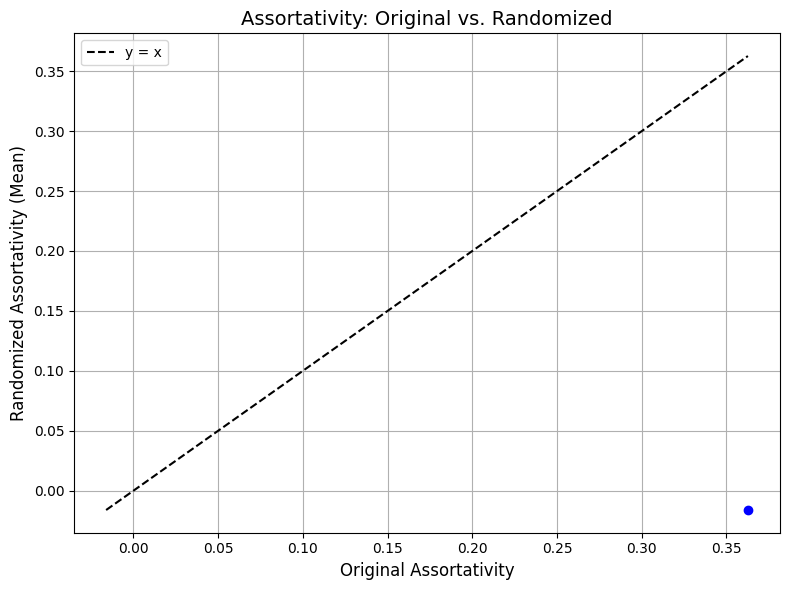

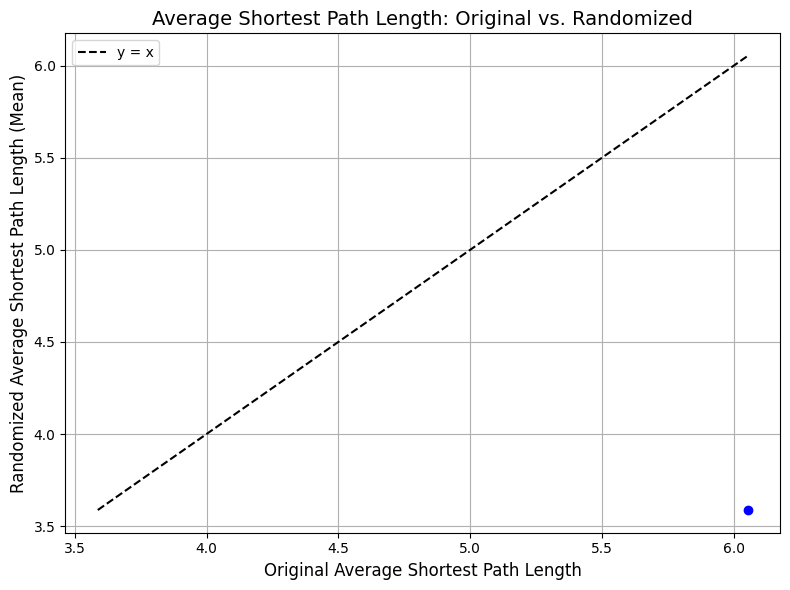

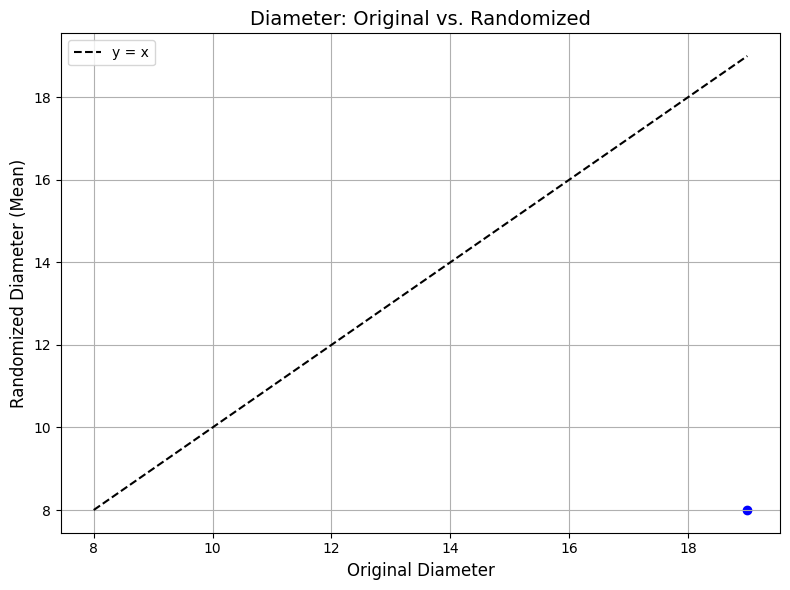

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate graph properties
def calculate_properties(G):
    clustering = nx.average_clustering(G)
    assortativity = nx.degree_assortativity_coefficient(G)
    
    # Calculate for the largest connected component if graph is disconnected
    if nx.is_connected(G):
        largest_component = G
    else:
        largest_component = G.subgraph(max(nx.connected_components(G), key=len)).copy()
    
    avg_shortest_path = nx.average_shortest_path_length(largest_component)
    diameter = nx.diameter(largest_component)
    
    return clustering, assortativity, avg_shortest_path, diameter

# Function to plot scatter comparison
def plot_measure_scatter(x_values, y_values, xlabel, ylabel, title, loglog=False):
    plt.figure(figsize=(8, 6))
    plt.scatter(x_values, y_values, color='blue')
    if loglog:
        plt.xscale('log')
        plt.yscale('log')
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.title(title, fontsize=14)
    # Reference line y = x
    min_val = min(min(x_values), min(y_values))
    max_val = max(max(x_values), max(y_values))
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', label='y = x')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Now we can analyze G_filtered if defined
def analyze_properties_for_G_filtered(G_filtered, sample_size=10):
    # Calculate properties for G_filtered
    clustering, assortativity, avg_shortest_path, diameter = calculate_properties(G_filtered)

    # Randomized graph properties
    rand_clustering_vals = []
    rand_assortativity_vals = []
    rand_avg_shortest_path_vals = []
    rand_diameter_vals = []

    for _ in range(sample_size):
        # Randomize the graph while preserving the degree distribution
        G_random = nx.smallworld.random_reference(G_filtered, niter=10, connectivity=False)

        # Calculate properties of the randomized graph
        rand_clustering, rand_assortativity, rand_avg_shortest_path, rand_diameter = calculate_properties(G_random)

        rand_clustering_vals.append(rand_clustering)
        rand_assortativity_vals.append(rand_assortativity)
        rand_avg_shortest_path_vals.append(rand_avg_shortest_path)
        rand_diameter_vals.append(rand_diameter)

    # Compute mean properties for randomized graphs
    random_clustering_mean = np.mean(rand_clustering_vals)
    random_assortativity_mean = np.mean(rand_assortativity_vals)
    random_avg_shortest_path_mean = np.mean(rand_avg_shortest_path_vals)
    random_diameter_mean = np.mean(rand_diameter_vals)

    # Plot comparisons
    plot_measure_scatter(
        [clustering],
        [random_clustering_mean],
        'Original Average Clustering Coefficient',
        'Randomized Average Clustering Coefficient (Mean)',
        'Clustering Coefficient: Original vs. Randomized'
    )

    plot_measure_scatter(
        [assortativity],
        [random_assortativity_mean],
        'Original Assortativity',
        'Randomized Assortativity (Mean)',
        'Assortativity: Original vs. Randomized'
    )

    plot_measure_scatter(
        [avg_shortest_path],
        [random_avg_shortest_path_mean],
        'Original Average Shortest Path Length',
        'Randomized Average Shortest Path Length (Mean)',
        'Average Shortest Path Length: Original vs. Randomized'
    )

    plot_measure_scatter(
        [diameter],
        [random_diameter_mean],
        'Original Diameter',
        'Randomized Diameter (Mean)',
        'Diameter: Original vs. Randomized'
    )

analyze_properties_for_G_filtered(G_filtered)



Calculating best minimal value for power law fit


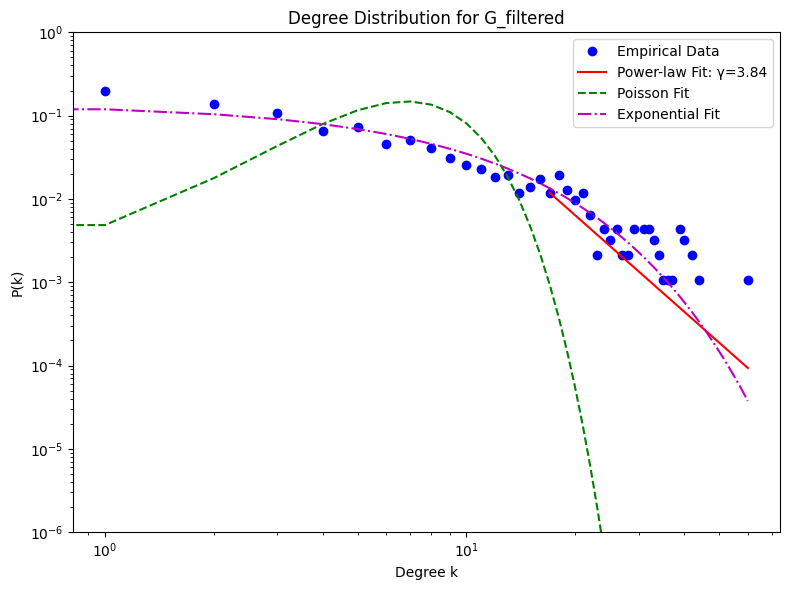

In [ ]:
import networkx as nx
import powerlaw
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import poisson, expon
from scipy.special import factorial

# Function to plot degree distribution for G_filtered
def plot_degree_distribution_for_G_filtered(graph, title):
    degrees = [d for n, d in graph.degree()]
    degree_counts = np.bincount(degrees)
    max_degree = len(degree_counts)
    x = np.arange(max_degree)
    y = degree_counts[x] / sum(degree_counts)  

    # Fit the degree distribution to a power law
    fit = powerlaw.Fit(degrees, discrete=True)
    gamma = fit.power_law.alpha
    xmin = int(fit.power_law.xmin)

    # Poisson and Exponential fits
    lambda_poisson = np.mean(degrees)
    poisson_pmf = poisson.pmf(x, lambda_poisson)

    lambda_exp = lambda_poisson 
    exp_pdf = expon.pdf(x, scale=lambda_exp)

    # Plot the degree distribution
    plt.figure(figsize=(8, 6))
    plt.loglog(x, y, 'bo', label='Empirical Data')
    plt.loglog(x[x >= xmin], (x[x >= xmin]**(-gamma)) * (y[xmin] / (xmin**(-gamma))), 'r-', label=f'Power-law Fit: γ={gamma:.2f}')
    plt.plot(x, poisson_pmf, 'g--', label='Poisson Fit')
    plt.plot(x, exp_pdf, 'm-.', label='Exponential Fit')
    plt.xlabel('Degree k')
    plt.ylabel('P(k)')
    plt.title(title)
    plt.ylim(1e-6, 1e0)  
    plt.legend()
    plt.tight_layout()
    plt.show()

# Execute the degree distribution plot for G_filtered
plot_degree_distribution_for_G_filtered(G_filtered, "Degree Distribution for G_filtered")


In [ ]:
import time
subreddit_user_map = {}
for subreddit in subreddits:
    name = subreddit['name']
    print(f"Fetching users from {name}...")  # Log progress
    try:
        users = fetch_users_from_activity(name, comment_limit=50, submission_limit=50)
        subreddit_user_map[name] = users
        print(f"Found {len(users)} users in {name}.")
    except Exception as e:
        print(f"Error fetching users from {name}: {e}")
    time.sleep(1)  # Avoid hitting API rate limits

# Display results
for subreddit, users in subreddit_user_map.items():
    print(f"{subreddit}: {len(users)} active users")

Fetching users from politics...
Found 90 users in politics.
Fetching users from NeutralPolitics...
Found 54 users in NeutralPolitics.
Fetching users from Ask_Politics...
Found 68 users in Ask_Politics.
Fetching users from ShitPoliticsSays...
Found 57 users in ShitPoliticsSays.
Fetching users from ukpolitics...
Found 80 users in ukpolitics.
Fetching users from CanadaPolitics...
Found 56 users in CanadaPolitics.
Fetching users from AustralianPolitics...
Found 55 users in AustralianPolitics.
Fetching users from Conservative...
Found 54 users in Conservative.
Fetching users from conspiracy...
Found 77 users in conspiracy.
Fetching users from AmericanPolitics...
Found 47 users in AmericanPolitics.
Fetching users from TexasPolitics...
Found 60 users in TexasPolitics.
Fetching users from PoliticalCompassMemes...
Found 82 users in PoliticalCompassMemes.
Fetching users from California_Politics...
Found 48 users in California_Politics.
Fetching users from Wild_Politics...
Found 54 users in Wild_

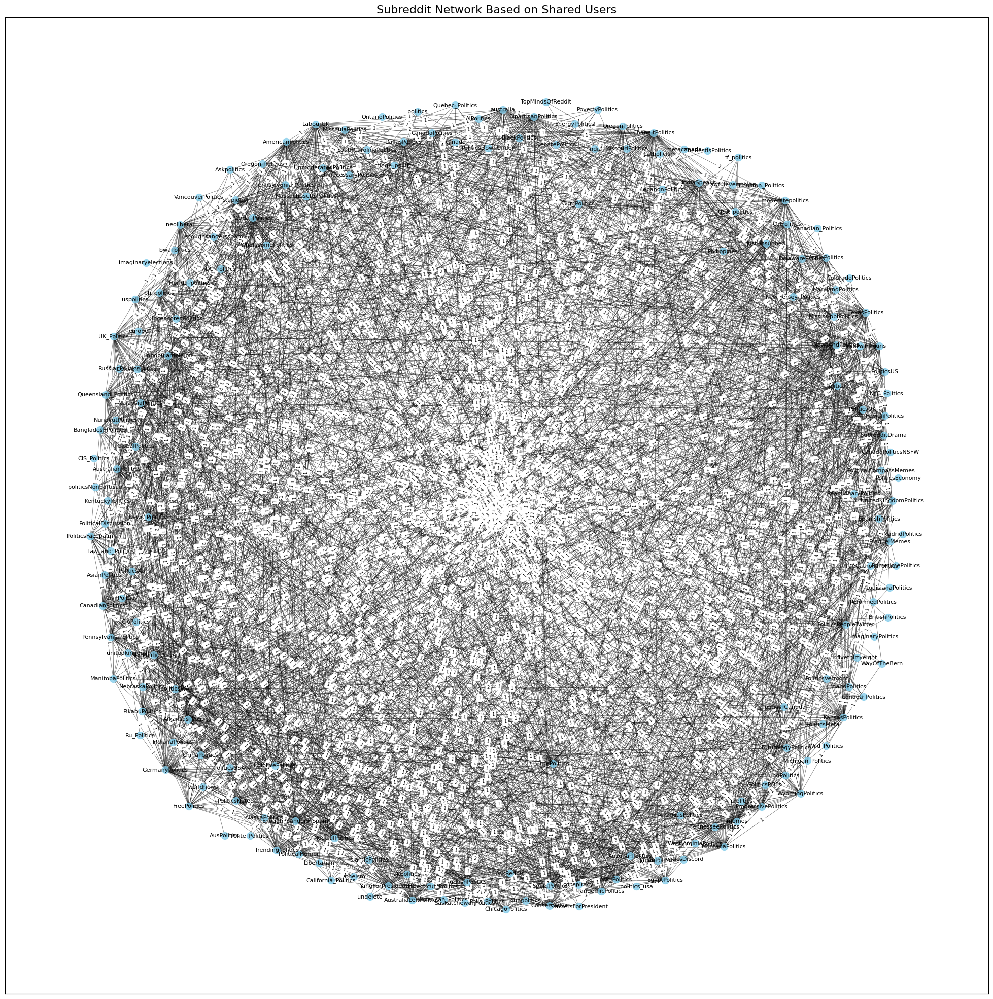

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Build the network graph from subreddit_user_map
def build_network(subreddit_user_map, threshold=1):
    G = nx.Graph()

    # Iterate through subreddit pairs to calculate shared users
    subreddits = list(subreddit_user_map.keys())
    for i in range(len(subreddits)):
        for j in range(i + 1, len(subreddits)):
            sub1 = subreddits[i]
            sub2 = subreddits[j]

            # Calculate shared users
            shared_users = subreddit_user_map[sub1] & subreddit_user_map[sub2]
            if len(shared_users) >= threshold:
                G.add_edge(sub1, sub2, weight=len(shared_users))
    
    return G

# Visualize the network graph
def visualize_network(G, spacing_factor=3.0, node_size=200, figsize=(20, 20)):
    # Use spring_layout with adjusted spacing
    pos = nx.spring_layout(G, seed=42, k=spacing_factor)

    # Draw the graph
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color="skyblue", alpha=0.8)
    nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.6)
    nx.draw_networkx_labels(G, pos, font_size=8, font_family="sans-serif")

    # Draw edge labels (optional: shared user count as weight)
    edge_labels = nx.get_edge_attributes(G, 'weight')
    # Comment out the next line if edge labels make the graph too messy
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=6)

    plt.title("Subreddit Network Based on Shared Users", fontsize=16)
    plt.show()

# Build and visualize the graph
threshold = 1  # Minimum shared users to create an edge
G = build_network(subreddit_user_map, threshold=threshold)

# Adjust parameters for better visualization
visualize_network(G, spacing_factor=5.0, node_size=100, figsize=(25, 25))
